### SOM Molecular Descriptors and Experimental Data

* this is a notebook that focues on molecular descriptors analysis 
* mordred descriptor is the package we implement here

In [1]:
from __future__ import print_function
import pandas as pd
import numpy as np
from sompy.sompy import SOMFactory

import sklearn
import sklearn.cluster as cluster
from sklearn import preprocessing
import urllib3
from sklearn.externals import joblib
import glob
import random

import tfprop_sompy
from tfprop_sompy import tfprop_config
from tfprop_sompy import tfprop_vis
from tfprop_sompy import tfprop_analysis
import images_gen
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

import matplotlib as mpl
import matplotlib.pyplot as plt
import images_gen
from images_gen import classify_by_group
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets
import pickle

CACHEDIR=C:\Users\jtz93\.matplotlib
Using fontManager instance from C:\Users\jtz93\.matplotlib\fontlist-v310.json
Loaded backend module://ipykernel.pylab.backend_inline version unknown.
Loaded backend module://ipykernel.pylab.backend_inline version unknown.


### Load the Data

In [2]:
data = pd.read_csv(r"./data/compdata_classification_des.csv").set_index("ID No.")
# "Voc","Jsc","FF","Monomer","Mw","PDI","DP","HOMO","LUMO","Bandgap"
# DP is related to Mw, and Mw is one of the most important property in OPV research
# 
names = ["Voc (V)","Jsc (mA/cm2)","FF","Mw (kg/mol)","HOMO (eV)"] #select essential experimental factors
sample = data.sample(400)
data.head(3)

C:\Users\jtz93\Anaconda3\envs\SOMenv\lib\site-packages\IPython\core\interactiveshell.py:3044: DtypeWarning: Columns (95,96,97,98,99,100,101,102,103,302,303,304,305,306,307,308,309,310,410,411,412,413,414,415,416,417,418,515,516,517,518,519,520,521,522,611,612,613,614,615,616,617,618,685,686,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,708,709,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,859,867,875,883,907,908,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,1091,1094,1095,1096,1097,1098,1099,1100,1101,1102,1103,1104,1105,1106,1107,1108,1109,1110,11

,Nickname,Ref. No,PCE_max,PCE_ave,Voc (V),Jsc (mA/cm2),FF,Mw (kg/mol),Mn (kg/mol),PDI,...,NumUnspecifiedAtomStereoCenters,labuteASA,tpsa,CrippenClogP,CrippenMR,chain1,chain2,number_chains,naRing.1,naRingbyChain
ID No.,,,,,,,,,,,,,,,,,,,,,
1,PBTTT-C14,S1,2.34,2.34,0.53,9.37,0.48,46.2,22.0,2.10,...,0,311.736973,0.00,17.52384,225.366,"[0, 14]","[14, 0]",2,4,2
2,PCDTBT,S2,3.60,3.60,0.89,6.92,0.63,73.0,37.0,1.97,...,0,316.643277,30.71,15.58234,226.976,[8],[9],1,7,7
3,PCPDTBT,S3,5.12,5.12,0.61,15.73,0.53,47.6,26.6,1.79,...,2,241.797891,25.78,11.57764,170.141,"[2, 2]","[7, 6]",2,4,2


In [3]:
data.info()
sample.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1203 entries, 1 to 1203
Columns: 1518 entries, Nickname to naRingbyChain
dtypes: bool(2), float64(835), int64(397), object(284)
memory usage: 13.9+ MB
<class 'pandas.core.frame.DataFrame'>
Int64Index: 400 entries, 517 to 122
Columns: 1518 entries, Nickname to naRingbyChain
dtypes: bool(2), float64(835), int64(397), object(284)
memory usage: 4.6+ MB


In [4]:
df = data[names]
sdf = sample[names]

df.columns = names
sdf.columns = names

df2 = df.as_matrix()
sdf2 = sdf.as_matrix()

df.head(5)

C:\Users\jtz93\Anaconda3\envs\SOMenv\lib\site-packages\ipykernel_launcher.py:7: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  import sys
C:\Users\jtz93\Anaconda3\envs\SOMenv\lib\site-packages\ipykernel_launcher.py:8: FutureWarning: Method .as_matrix will be removed in a future version. Use .values instead.
  


,Voc (V),Jsc (mA/cm2),FF,Mw (kg/mol),HOMO (eV)
ID No.,,,,,
1,0.53,9.37,0.48,46.2,5.10
2,0.89,6.92,0.63,73.0,5.50
3,0.61,15.73,0.53,47.6,5.30
4,0.77,18.40,0.74,93.7,5.34
5,0.77,18.20,0.74,52.9,5.20


## SOM Model

* dump and load the model to save time 
* multiple models are exported
* models include:
    * compdata
    * with or without certain elements
    
* errors are exported below - topographic error and quantization error
* hyperparameter tuning
    * finetune len
    * roughtune len
    * finetune radius
    * roughtune radius


## Visualization of SOM Results in 2D 
* quantization error is too high compare to the given example of tfprop
    * check for std, mean, max, min, var and other statistical data

In [5]:
# mapsize should accomodate all data points
mapsize = (80,80)

# length here
# dlen = len(data)
# nnodes = mapsize[0]*mapsize[1]
# train_len = 200*nnodes/float(dlen)
# train_len = int(np.ceil(trainlen))

# radius here
# radiusin = max(mapsize)/float(6) if min(mapsize)!=1
# radiusfin = radiusin/float(10)
# radius = np.linspace(radiusin, radiusfin, trainlen)

# sm = SOMFactory.build(df2, mapsize=mapsize, normalization='var',initialization='pca', component_names=names)
# sm.train(
#     n_job=4, 
#     verbose='info',
#     train_rough_len=None,
#     train_rough_radiusin=None,
#     train_rough_radiusfin=None,
#     train_finetune_len=None,
#     train_finetune_radiusin=None,
#     train_finetune_radiusfin=None,
#     train_len_factor=1
# )

In [6]:
# topographic_error = sm.calculate_topographic_error()
# quantitization_error = np.mean(sm._bmu[1])
# print("Topographic Error = %s; Quantitization Error = %s" % (topographic_error, quantitization_error))

In [7]:
# load the trained sm to perform clustering
# pickle.dump(sm, open("sm_13by13","wb"))
sm = pickle.load(open("sm_HOMO_Mw","rb"))

### Visualizations below

In [8]:
# index is the label 
labels = list(df.index)

findfont: Matching :family=sans-serif:style=normal:variant=normal:weight=semibold:stretch=normal:size=15.0.
findfont: score(<Font 'DejaVu Sans Display' (DejaVuSansDisplay.ttf) normal normal 400 normal>) = 10.24
findfont: score(<Font 'STIXSizeThreeSym' (STIXSizThreeSymReg.ttf) normal normal regular normal>) = 10.24
findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-BoldOblique.ttf) oblique normal bold normal>) = 11.145
findfont: score(<Font 'cmsy10' (cmsy10.ttf) normal normal 400 normal>) = 10.24
findfont: score(<Font 'cmss10' (cmss10.ttf) normal normal 400 normal>) = 10.24
findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Oblique.ttf) oblique normal 400 normal>) = 1.24
findfont: score(<Font 'STIXNonUnicode' (STIXNonUniIta.ttf) italic normal 400 normal>) = 11.24
findfont: score(<Font 'STIXSizeThreeSym' (STIXSizThreeSymBol.ttf) normal normal bold normal>) = 10.145
findfont: score(<Font 'STIXGeneral' (STIXGeneral.ttf) normal normal regular normal>) = 10.24
findfont: score(<Font 'STIXS

findfont: score(<Font 'Cambria' (cambriai.ttf) italic normal 400 normal>) = 11.24
findfont: score(<Font 'Malgun Gothic' (malgun.ttf) normal normal 400 normal>) = 10.24
findfont: score(<Font 'Courant' (CON_____.ttf) normal normal 400 normal>) = 10.24
findfont: score(<Font 'Courant' (COO_____.ttf) italic normal 400 normal>) = 11.24
findfont: score(<Font 'ESSTIXOne' (ESSTIX1_.TTF) normal normal 400 normal>) = 10.24
findfont: score(<Font 'Cambria' (cambriab.ttf) normal normal bold normal>) = 10.145
findfont: score(<Font 'Gill Sans Ultra Bold Condensed' (GILLUBCD.TTF) normal normal bold condensed>) = 10.344999999999999
findfont: score(<Font 'Rockwell' (ROCKI.TTF) italic normal 400 normal>) = 11.24
findfont: score(<Font 'Segoe UI' (segoeuii.ttf) italic normal 400 normal>) = 11.24
findfont: score(<Font 'Bodoni MT' (BOD_I.TTF) italic normal 400 normal>) = 11.24
findfont: score(<Font 'Corbel' (corbelz.ttf) italic normal bold normal>) = 11.145
findfont: score(<Font 'CSD16' (csd16.ttf) normal nor

findfont: score(<Font 'Candara' (Candara.ttf) normal normal 400 normal>) = 10.24
findfont: score(<Font 'Symbol' (symbol.ttf) normal normal 400 normal>) = 10.24
findfont: score(<Font 'Goudy Stout' (GOUDYSTO.TTF) normal normal 400 normal>) = 10.24
findfont: score(<Font 'Segoe UI' (seguibli.ttf) italic normal black normal>) = 11.335
findfont: score(<Font 'HoloLens MDL2 Assets' (holomdl2.ttf) normal normal 400 normal>) = 10.24
findfont: score(<Font 'Arial' (ariblk.ttf) normal normal black normal>) = 6.698636363636363
findfont: score(<Font 'Yu Gothic' (YuGothB.ttc) normal normal bold normal>) = 10.145
findfont: score(<Font 'Matura MT Script Capitals' (MATURASC.TTF) normal normal 400 normal>) = 10.24
findfont: score(<Font 'STSong' (STSONG.TTF) normal normal 400 normal>) = 10.24
findfont: score(<Font 'Leelawadee UI' (LeelawUI.ttf) normal normal 400 normal>) = 10.24
findfont: score(<Font 'Colonna MT' (COLONNA.TTF) normal normal 400 normal>) = 10.24
findfont: score(<Font 'Perpetua' (PERB____.TT

findfont: score(<Font 'Wingdings' (wingding.ttf) normal normal 400 normal>) = 10.24
findfont: score(<Font 'MingLiU-ExtB' (mingliub.ttc) normal normal 400 normal>) = 10.24
findfont: score(<Font 'DejaVu Sans' (DejaVuSansCondensed-BoldOblique.ttf) oblique normal bold condensed>) = 1.345
findfont: score(<Font 'Constantia' (constan.ttf) normal normal 400 normal>) = 10.24
findfont: score(<Font 'Modern No. 20' (MOD20.TTF) normal normal 400 normal>) = 10.24
findfont: score(<Font 'Constantia' (constanb.ttf) normal normal bold normal>) = 10.145
findfont: score(<Font 'ESSTIXSeven' (ESSTIX7_.TTF) normal normal 400 normal>) = 10.24
findfont: score(<Font 'Courier New' (courbi.ttf) italic normal bold normal>) = 11.145
findfont: score(<Font 'ESSTIXThree' (ESSTIX3_.TTF) normal normal 400 normal>) = 10.24
findfont: score(<Font 'Californian FB' (CALIFB.TTF) normal normal bold normal>) = 10.145
findfont: score(<Font 'jdiconfontA' (jdiconfontA.TTF) normal normal 400 normal>) = 10.24
findfont: score(<Font '

findfont: score(<Font 'Bauhaus 93' (BAUHS93.TTF) normal normal 400 normal>) = 10.24
findfont: score(<Font 'Malgun Gothic' (malgunbd.ttf) normal normal bold normal>) = 10.145
findfont: score(<Font 'Myanmar Text' (mmrtextb.ttf) normal normal bold normal>) = 10.145
findfont: score(<Font 'Calibri' (calibrii.ttf) italic normal 400 normal>) = 11.24
findfont: score(<Font 'Arial' (ARIALNI.TTF) italic normal 400 condensed>) = 7.803636363636364
findfont: score(<Font 'Bookman Old Style' (BOOKOS.TTF) normal normal book normal>) = 10.24
findfont: score(<Font 'Microsoft PhagsPa' (phagspab.ttf) normal normal bold normal>) = 10.145
findfont: score(<Font 'Playbill' (PLAYBILL.TTF) normal normal 400 normal>) = 10.24
findfont: score(<Font 'ESSTIXNine' (ESSTIX9_.TTF) normal normal 400 normal>) = 10.24
findfont: score(<Font 'Roboto' (Roboto-Black.ttf) normal normal black normal>) = 10.335
findfont: score(<Font 'Cambria' (cambria.ttc) normal normal 400 normal>) = 10.24
findfont: score(<Font 'Wingdings 3' (WI

findfont: score(<Font 'Yu Gothic' (YuGothR.ttc) normal normal regular normal>) = 10.24
findfont: score(<Font 'Gloucester MT Extra Condensed' (GLECB.TTF) normal normal 400 condensed>) = 10.44
findfont: score(<Font 'Times New Roman' (timesbd.ttf) normal normal roman normal>) = 10.145
findfont: score(<Font 'MS Outlook' (OUTLOOK.TTF) normal normal 400 normal>) = 10.24
findfont: score(<Font 'Elephant' (ELEPHNT.TTF) normal normal 400 normal>) = 10.24
findfont: score(<Font 'icon-large' (icon-large.ttf) normal normal 400 normal>) = 10.24
findfont: score(<Font 'Calibri' (calibri.ttf) normal normal 400 normal>) = 10.24
findfont: score(<Font 'icon-ui' (icon-ui.ttf) normal normal 400 normal>) = 10.24
findfont: Matching :family=sans-serif:style=normal:variant=normal:weight=semibold:stretch=normal:size=15.0 to DejaVu Sans ('C:\\Users\\jtz93\\Anaconda3\\envs\\SOMenv\\lib\\site-packages\\matplotlib\\mpl-data\\fonts\\ttf\\DejaVuSans-Bold.ttf') with score of 0.145000.


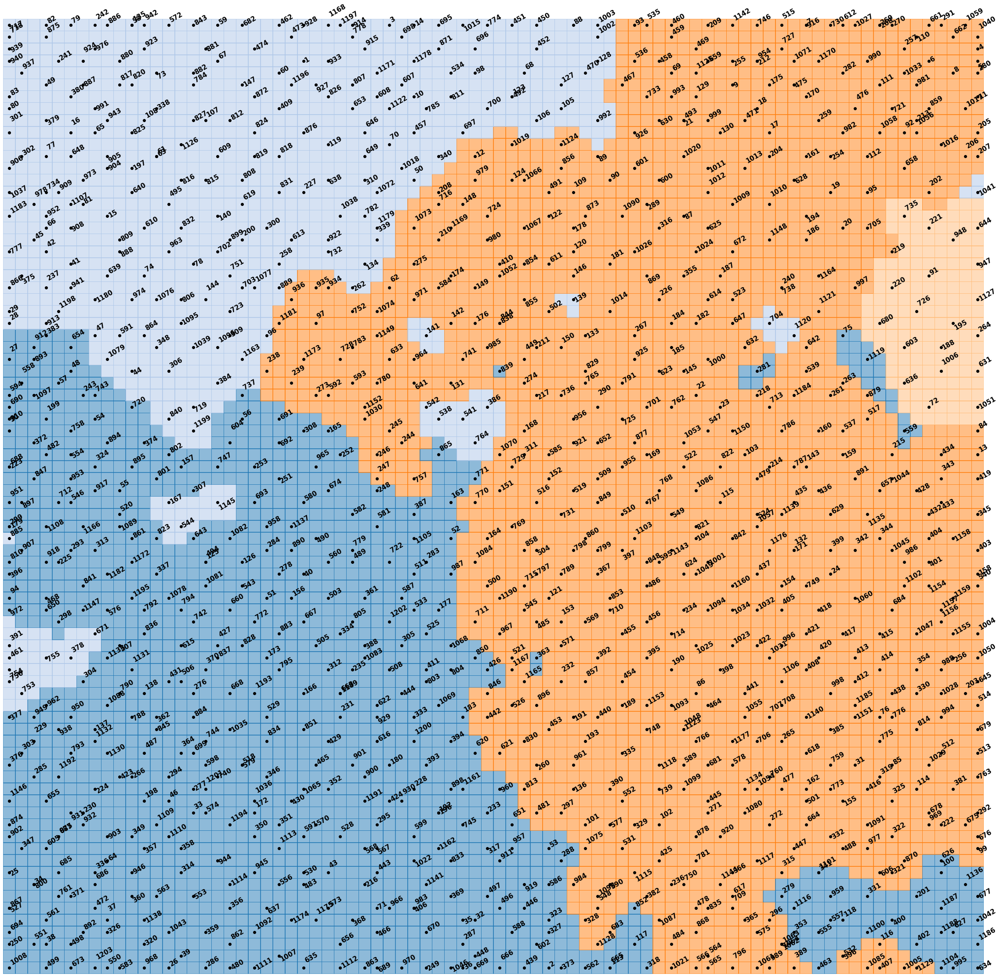

In [9]:
n_clusters = 4

cmap = plt.get_cmap("tab20")
n_palette = 20  # number of different colors in this color palette
color_list = [cmap((i % n_palette)/n_palette) for i in range(n_clusters)]
msz = sm.codebook.mapsize
proj = sm.project_data(sm.data_raw)
coord = sm.bmu_ind_to_xy(proj)

fig, ax = plt.subplots(1, 1, figsize=(40,40))

#cl_labels = som.cluster(n_clusters)
cl_labels = sklearn.cluster.KMeans(n_clusters = n_clusters, 
                                   random_state = 555).fit_predict(sm.codebook.matrix)

# fill each rectangular unit area with cluster color
# and draw line segment to the border of cluster
norm = mpl.colors.Normalize(vmin=0, vmax=n_palette, clip=True)

# borders
ax.pcolormesh(cl_labels.reshape(msz[0], msz[1]).T % n_palette,
            cmap=cmap, norm=norm, edgecolors='face',
            lw=0.5, alpha=0.5)

ax.scatter(coord[:, 0]+0.5, coord[:, 1]+0.5, c='k', marker='o')
ax.axis('off')


for label, x, y in zip(labels, coord[:, 0], coord[:, 1]):
    x += 0.2
    y += 0.2
    # "+ 0.1" means shift of label location to upperright direction

    # randomize the location of the label not to be overwrapped with each other
    # x_text += 0.1 * np.random.randn()
    y += 0.3 * np.random.randn()

    # wrap of label for chemical compound
    # label = str_wrap(label)

    ax.text(x+0.3, y+0.3, label,
            horizontalalignment='left', verticalalignment='bottom',
            rotation=30, fontsize=15, weight='semibold')

# plt.savefig('Images/cluster/cluster_HOMO_Mw.png')

locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x000001F0E6F80A90>
Using auto colorbar locator on colorbar
locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x000001F0E6F80A90>
Setting pcolormesh
locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x000001F0E7360CC0>
Using auto colorbar locator on colorbar
locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x000001F0E7360CC0>
Setting pcolormesh
locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x000001F0EA82DBA8>
Using auto colorbar locator on colorbar
locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x000001F0EA82DBA8>
Setting pcolormesh
locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x000001F0EAD48748>
Using auto colorbar locator on colorbar
locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x000001F0EAD48748>
Setting pcolormesh
locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x000001F0EB2632E8>
Using auto colorbar locator on colo

findfont: score(<Font 'Marlett' (marlett.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (seguibl.ttf) normal normal black normal>) = 10.525
findfont: score(<Font 'Georgia' (georgia.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Sitka Small' (Sitka.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bookman Old Style' (BOOKOSI.TTF) italic normal book normal>) = 11.05
findfont: score(<Font 'FangSong' (simfang.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Franklin Gothic Heavy' (FRAHVIT.TTF) italic normal heavy normal>) = 11.43
findfont: score(<Font 'Rage Italic' (RAGE.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Goudy Old Style' (GOUDOSB.TTF) normal normal bold normal>) = 10.335
findfont: score(<Font 'Trebuchet MS' (trebucit.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Dubai' (DUBAI-REGULAR.TTF) normal normal regular normal>) = 10.05
findfont: score(<Font 'ESSTIXFive' (ESSTIX5_.TTF) 

findfont: score(<Font 'Palatino Linotype' (palab.ttf) normal normal bold normal>) = 10.335
findfont: score(<Font 'STZhongsong' (STZHONGS.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Tw Cen MT' (TCBI____.TTF) italic normal bold normal>) = 11.335
findfont: score(<Font 'Goudy Old Style' (GOUDOS.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Yu Gothic' (YuGothL.ttc) normal normal light normal>) = 10.24
findfont: score(<Font 'Book Antiqua' (ANTQUAB.TTF) normal normal book normal>) = 10.05
findfont: score(<Font 'Simple Straight 3' (sc_simple_straight_3.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Franklin Gothic Demi' (FRADM.TTF) normal normal demi normal>) = 10.24
findfont: score(<Font 'Lucida Calligraphy' (LCALLIG.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Century Schoolbook' (SCHLBKB.TTF) normal normal book normal>) = 10.05
findfont: score(<Font 'Gill Sans MT' (GILB____.TTF) normal normal bold normal>) = 10.335
findfo

findfont: score(<Font 'Jokerman' (JOKERMAN.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bradley Hand ITC' (BRADHITC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'FZShuTi' (FZSTK.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'ESSTIXFourteen' (ESSTIX14.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Tw Cen MT Condensed' (TCCB____.TTF) normal normal bold condensed>) = 10.535
findfont: score(<Font 'Ebrima' (ebrima.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_PSTC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Harlow Solid Italic' (HARLOWSI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Thames' (THR_____.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (segoeuil.ttf) normal normal light normal>) = 10.24
findfont: score(<Font 'Helonia' (HEB_____.ttf) normal normal bold normal>) = 10.335
findfont: score(<Font 'Eras Demi ITC' (ERASDEMI.TTF)

findfont: score(<Font 'Lucida Sans Typewriter' (LTYPEB.TTF) normal normal bold normal>) = 10.335
findfont: score(<Font 'icon-brand' (icon-brand.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'ESSTIXTen' (ESSTIX10.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Yu Gothic' (YuGothM.ttc) normal normal medium normal>) = 10.145
findfont: score(<Font 'Leelawadee UI' (LeelaUIb.ttf) normal normal bold normal>) = 10.335
findfont: score(<Font 'Brush Script MT' (BRUSHSCI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Franklin Gothic Book' (FRABK.TTF) normal normal book normal>) = 10.05
findfont: score(<Font 'Viner Hand ITC' (VINERITC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Calisto MT' (CALISTB.TTF) normal normal bold normal>) = 10.335
findfont: score(<Font 'STKaiti' (STKAITI.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Candara' (Candarab.ttf) normal normal bold normal>) = 10.335
findfont: score(<Font 'Sitka Sma

findfont: score(<Font 'Segoe UI' (segoeuib.ttf) normal normal bold normal>) = 10.335
findfont: score(<Font 'FontAwesome' (fontawesome-webfont.ttf) normal normal regular normal>) = 10.05
findfont: score(<Font 'Franklin Gothic Book' (FRABKIT.TTF) italic normal book normal>) = 11.05
findfont: score(<Font 'MT Extra' (MTEXTRA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Poor Richard' (POORICH.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'High Tower Text' (HTOWERT.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'JdIonicons' (jdIonicons.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'SimSun' (simsun.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Bodoni MT' (BOD_CBI.TTF) italic normal bold condensed>) = 11.535
findfont: score(<Font 'Corbel' (corbelb.ttf) normal normal bold normal>) = 10.335
findfont: score(<Font 'Franklin Gothic Demi Cond' (FRADMCN.TTF) normal normal demi condensed>) = 10.44
findfont: score(<Font '

findfont: score(<Font 'Corbel' (corbeli.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Garamond' (GARA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Sitka Small' (SitkaB.ttc) normal normal bold normal>) = 10.335
findfont: score(<Font 'Museo Sans For Dell' (MuseoSansForDell-Regular.ttf) normal normal regular normal>) = 10.05
findfont: score(<Font 'Segoe Script' (segoesc.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Fax' (LFAXI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Tw Cen MT' (TCMI____.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Georgia' (georgiai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Tahoma' (tahomabd.ttf) normal normal bold normal>) = 10.335
findfont: score(<Font 'Nirmala UI' (Nirmala.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Copperplate Gothic Bold' (COPRGTB.TTF) normal normal bold normal>) = 10.335
findfont: score(<Font 'Marlett' (marlett.

findfont: score(<Font 'Gill Sans MT' (GILBI___.TTF) italic normal bold normal>) = 11.335
findfont: score(<Font 'Tempus Sans ITC' (TEMPSITC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Calisto MT' (CALISTBI.TTF) italic normal bold normal>) = 11.335
findfont: score(<Font 'Arial' (ARIALN.TTF) normal normal 400 condensed>) = 6.613636363636363
findfont: score(<Font 'STFangsong' (STFANGSO.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'High Tower Text' (HTOWERTI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'jdiconfontD' (jdiconfontD.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Courant' (COB_____.ttf) normal normal bold normal>) = 10.335
findfont: score(<Font 'Bell MT' (BELLB.TTF) normal normal bold normal>) = 10.335
findfont: score(<Font 'Goudy Old Style' (GOUDOSI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Gill Sans Ultra Bold' (GILSANUB.TTF) normal normal bold normal>) = 10.335
findfont: score(<Font 'Pal

findfont: score(<Font 'Leelawadee UI' (LeelUIsl.ttf) normal normal light normal>) = 10.24
findfont: score(<Font 'Haettenschweiler' (HATTEN.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Courant' (COBO____.ttf) italic normal bold normal>) = 11.335
findfont: score(<Font 'STXingkai' (STXINGKA.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Sans' (DejaVuSans-ExtraLight.ttf) normal normal light normal>) = 0.24
findfont: score(<Font 'Helonia' (HEN_____.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'ESSTIXSeventeen' (ESSTIX17.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Old English Text MT' (OLDENGL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Gadugi' (gadugi.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Century Gothic' (GOTHICI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'GLYPHICONS Halflings' (glyphicons-halflings-regular.ttf) normal normal regular normal>) = 10.05
fi

findfont: score(<Font 'Garamond' (GARAIT.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Microsoft PhagsPa' (phagspa.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Rockwell Condensed' (ROCC____.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Microsoft YaHei' (msyhbd.ttc) normal normal bold normal>) = 10.335
findfont: score(<Font 'Adobe Devanagari' (AdobeDevanagari-BoldItalic.otf) italic normal bold normal>) = 11.335
findfont: score(<Font 'KaiTi' (simkai.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Berlin Sans FB' (BRLNSB.TTF) normal normal bold normal>) = 10.335
findfont: score(<Font 'Maiandra GD' (MAIAN.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Dubai' (DUBAI-LIGHT.TTF) normal normal light normal>) = 10.24
findfont: score(<Font 'ESSTIXEleven' (ESSTIX11.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Forte' (FORTE.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Sa

findfont: score(<Font 'Perpetua Titling MT' (PERTIBD.TTF) normal normal bold normal>) = 10.335
findfont: score(<Font 'Copperplate Gothic Light' (COPRGTL.TTF) normal normal light normal>) = 10.24
findfont: score(<Font 'Californian FB' (CALIFI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Roboto' (Roboto-Thin.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Museo Sans For Dell' (MuseoSansForDell-Bold.ttf) normal normal bold normal>) = 10.335
findfont: score(<Font 'Ebrima' (ebrimabd.ttf) normal normal bold normal>) = 10.335
findfont: score(<Font 'Onyx' (ONYX.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Lucida Sans' (LSANSD.TTF) normal normal roman normal>) = 10.145
findfont: score(<Font 'Lucida Fax' (LFAX.TTF) normal normal regular normal>) = 10.05
findfont: score(<Font 'Gill Sans MT' (GILI____.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Segoe UI' (segoeuib.ttf) normal normal bold normal>) = 10.335
findfont: score(<Font '

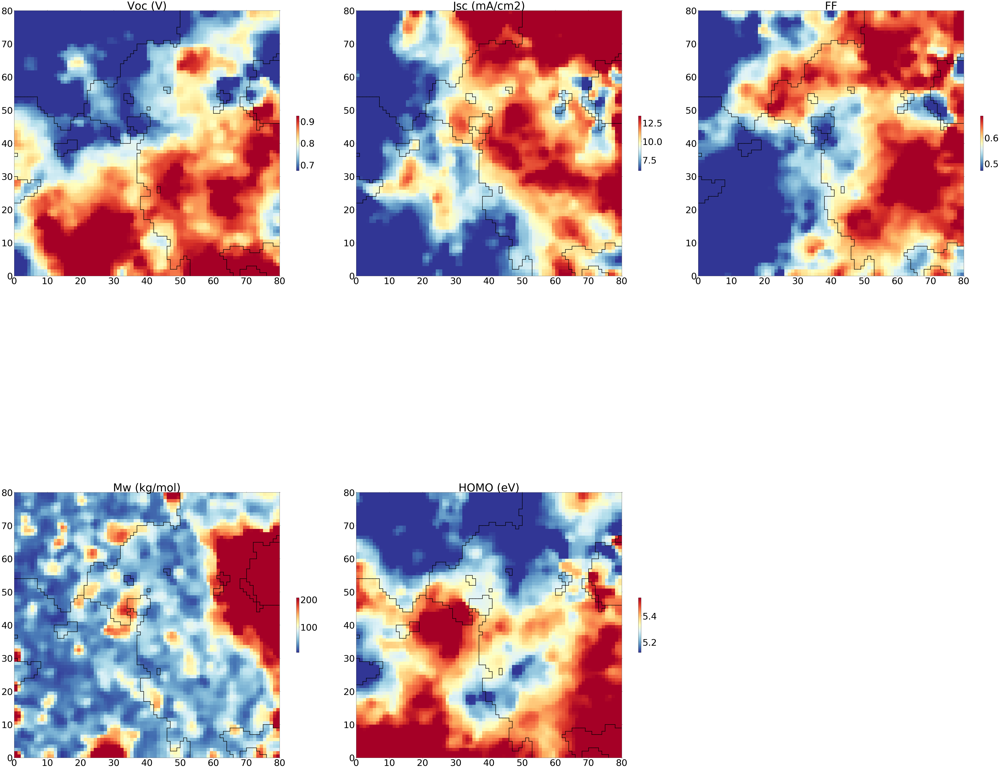

Saving figure of heat map for all thermofluid prop. to Images/component/heatmap_Mw_HOMO.png...


In [10]:
htmap_x, htmap_y = (80, 80)
viewTFP = tfprop_vis.ViewTFP(htmap_x, htmap_y, '',text_size=50)

cmap = plt.get_cmap('RdYlBu_r')  # set color map
comp_map = viewTFP.show(sm, cl_labels, "Images/component/heatmap_Mw_HOMO.png", col_sz=3,
             which_dim='all', desnormalize=True, col_norm='median',cmap=cmap,isOutHtmap=True)

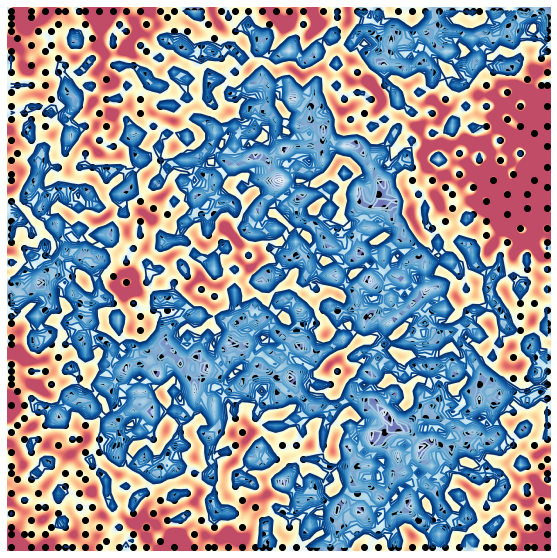

Saving figure of U-matrix to Images/umat/umat_Mw_HOMO.png...


In [11]:
umatrixTFP = tfprop_vis.UMatrixTFP(0, 0, '', text_size=14)

cmap = plt.get_cmap('RdYlBu_r')  # set color map
umat = umatrixTFP.show(sm, pd.DataFrame(labels),
                        pd.DataFrame(labels), "Images/umat/umat_Mw_HOMO.png",
                        show_data=True, labels=False, contooor=True,
                        cmap=cmap,isOutUmat=True,blob = True)

**The right bottom corner was suspected to have sparse data space, thus removing them can be a good option ?**

## Load

In [12]:
def clusteringmap_category(sm,n_clusters,dataset,colorcategory, savepath):
    """
    Description:
    This function is used to output maps that prints colors on dots based
    on their properties
    """
    categories = dataset[colorcategory] #if colorcategory is one col of the dataset
    cmap = plt.get_cmap("tab20") #cmap for background
    n_palette = 20  # number of different colors in this color palette
    color_list = [cmap((i % n_palette)/n_palette) for i in range(n_clusters)]
    msz = sm.codebook.mapsize
    proj = sm.project_data(sm.data_raw)
    coord = sm.bmu_ind_to_xy(proj)

    fig, ax = plt.subplots(1, 1, figsize=(30,30))

    cl_labels = sklearn.cluster.KMeans(n_clusters=n_clusters,random_state=555).fit_predict(sm.codebook.matrix)
        
    # fill each rectangular unit area with cluster color
    #  and draw line segment to the border of cluster
    norm = mpl.colors.Normalize(vmin=0, vmax=n_palette, clip=True)
#     ax.pcolormesh(cl_labels.reshape(msz[0], msz[1]).T % n_palette,
#                 cmap=cmap, norm=norm, edgecolors='face',
#                 lw=0.5, alpha=0.5)

    ax.scatter(coord[:, 0]+0.5, coord[:, 1]+0.5, c='k', marker='o')
    ax.axis('off')

    categoryname = list(dataset.groupby(colorcategory).count().index)
    categories_int = categories.apply(categoryname.index)

    N = len(categoryname)
    cmap_labels = plt.cm.gist_ncar
    # extract all colors from the .jet map
    cmaplist = [cmap_labels(i) for i in range(cmap_labels.N)]
    # create the new map
    cmap_labels = cmap_labels.from_list('Custom cmap', cmaplist, cmap_labels.N)
    # define the bins and normalize
    bounds = np.linspace(0,N,N+1)
    norm_labels = mpl.colors.BoundaryNorm(bounds, cmap_labels.N)

    scat = ax.scatter(coord[:, 0]+0.5, coord[:, 1]+0.5, c=categories_int,s=300,cmap=cmap_labels,norm=norm_labels)
    cbar = plt.colorbar(scat, spacing='proportional',ticks=bounds)
    cbar.ax.get_yaxis().set_ticks([])
    
    for j, lab in enumerate(categoryname):
        cbar.ax.text(1, (2 * j + 1) / (2*(len(categoryname))), lab, ha='left', va='center', fontsize=30)
    cbar.ax.get_yaxis().labelpad = 15
    # cbar.ax.set_ylabel('# of contacts', rotation=270)
    ax.axis('off')

    for x, y in zip(coord[:, 0], coord[:, 1]):
        x += 0.2
        y += 0.2
        # "+ 0.1" means shift of label location to upperright direction

        # randomize the location of the label
        #   not to be overwrapped with each other
        # x_text += 0.1 * np.random.randn()
        y += 0.3 * np.random.randn()

        # wrap of label for chemical compound
        #label = str_wrap(label)

        # ax.text(x+0.3, y+0.3,horizontalalignment='left', verticalalignment='bottom',rotation=30, fontsize=12, weight='semibold')
    # cl_labels = som.cluster(n_clusters)
    cl_labels = sklearn.cluster.KMeans(n_clusters = n_clusters, 
                                       random_state = 555).fit_predict(sm.codebook.matrix)

    for i in range(len(cl_labels)):
        rect_x = [i // msz[1], i // msz[1],
                i // msz[1] + 1, i // msz[1] + 1]
        rect_y = [i % msz[1], i % msz[1] + 1,
                i % msz[1] + 1, i % msz[1]]

        if i % msz[1] + 1 < msz[1]:  # top border
            if cl_labels[i] != cl_labels[i+1]:
                ax.plot([rect_x[1], rect_x[2]],
                        [rect_y[1], rect_y[2]], 'k-', lw=2.5)

        if i + msz[1] < len(cl_labels):  # right border
            if cl_labels[i] != cl_labels[i+msz[1]]:
                ax.plot([rect_x[2], rect_x[3]],
                        [rect_y[2], rect_y[3]], 'k-', lw=2.5)

    plt.savefig(savepath)
    return cl_labels

In [13]:
data["Eloss_Categ"] = classify_by_group(data,"Eloss",5)
data["PCE_Categ"] = classify_by_group(data,"PCE_ave",5)
data["DP_Categ"] = classify_by_group(data,"DP",5)
data["PDI_Categ"] = classify_by_group(data,"PDI",5)
# data['Bandgap_Categ'] = classify_by_group(data,"Bandgap (eV)",5)
# data['nRot_Categ'] = classify_by_group(data,"nRot",5)
# data['Rotratio_Categ'] = classify_by_group(data,"RotRatio",5)
# data['TopoPSA(NO)_Categ'] = classify_by_group(data,"TopoPSA(NO)",5)
# data['TopoPSA_Categ'] = classify_by_group(data,"TopoPSA",5)

data['n5Ring_Categ'] = classify_by_group(data,"n5Ring",5)
data['n6Ring_Categ'] = classify_by_group(data,"n6Ring",5)
data['nRing_Categ'] = classify_by_group(data,"nRing",5)

locator: <matplotlib.ticker.FixedLocator object at 0x000001F0E62B9B38>
Using fixed locator on colorbar
Setting pcolormesh
findfont: Matching :family=sans-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=30.0.
findfont: score(<Font 'DejaVu Sans Display' (DejaVuSansDisplay.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'STIXSizeThreeSym' (STIXSizThreeSymReg.ttf) normal normal regular normal>) = 10.05
findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-BoldOblique.ttf) oblique normal bold normal>) = 11.335
findfont: score(<Font 'cmsy10' (cmsy10.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'cmss10' (cmss10.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Oblique.ttf) oblique normal 400 normal>) = 1.05
findfont: score(<Font 'STIXNonUnicode' (STIXNonUniIta.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'STIXSizeThreeSym' (STIXSizThreeSymBol.ttf) normal normal bold normal>) = 10.335
f

findfont: score(<Font 'ESSTIXFive' (ESSTIX5_.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Times New Roman' (times.ttf) normal normal roman normal>) = 10.145
findfont: score(<Font 'Cambria' (cambriai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Malgun Gothic' (malgun.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Courant' (CON_____.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Courant' (COO_____.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'ESSTIXOne' (ESSTIX1_.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Cambria' (cambriab.ttf) normal normal bold normal>) = 10.335
findfont: score(<Font 'Gill Sans Ultra Bold Condensed' (GILLUBCD.TTF) normal normal bold condensed>) = 10.535
findfont: score(<Font 'Rockwell' (ROCKI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Segoe UI' (segoeuii.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Bodoni MT' (BOD_I.TTF) italic

findfont: score(<Font 'Gill Sans MT' (GILB____.TTF) normal normal bold normal>) = 10.335
findfont: score(<Font 'Niagara Engraved' (NIAGENG.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Candara' (Candara.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Symbol' (symbol.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Goudy Stout' (GOUDYSTO.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (seguibli.ttf) italic normal black normal>) = 11.525
findfont: score(<Font 'HoloLens MDL2 Assets' (holomdl2.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Arial' (ariblk.ttf) normal normal black normal>) = 6.888636363636364
findfont: score(<Font 'Yu Gothic' (YuGothB.ttc) normal normal bold normal>) = 10.335
findfont: score(<Font 'Matura MT Script Capitals' (MATURASC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'STSong' (STSONG.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Leelawadee UI' 

findfont: score(<Font 'Helonia' (HEB_____.ttf) normal normal bold normal>) = 10.335
findfont: score(<Font 'Eras Demi ITC' (ERASDEMI.TTF) normal normal demi normal>) = 10.24
findfont: score(<Font 'Wingdings' (wingding.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MingLiU-ExtB' (mingliub.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Sans' (DejaVuSansCondensed-BoldOblique.ttf) oblique normal bold condensed>) = 1.535
findfont: score(<Font 'Constantia' (constan.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Modern No. 20' (MOD20.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Constantia' (constanb.ttf) normal normal bold normal>) = 10.335
findfont: score(<Font 'ESSTIXSeven' (ESSTIX7_.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Courier New' (courbi.ttf) italic normal bold normal>) = 11.335
findfont: score(<Font 'ESSTIXThree' (ESSTIX3_.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Calif

findfont: score(<Font 'Candara' (Candarab.ttf) normal normal bold normal>) = 10.335
findfont: score(<Font 'Sitka Small' (SitkaI.ttc) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Bauhaus 93' (BAUHS93.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Malgun Gothic' (malgunbd.ttf) normal normal bold normal>) = 10.335
findfont: score(<Font 'Myanmar Text' (mmrtextb.ttf) normal normal bold normal>) = 10.335
findfont: score(<Font 'Calibri' (calibrii.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Arial' (ARIALNI.TTF) italic normal 400 condensed>) = 7.613636363636363
findfont: score(<Font 'Bookman Old Style' (BOOKOS.TTF) normal normal book normal>) = 10.05
findfont: score(<Font 'Microsoft PhagsPa' (phagspab.ttf) normal normal bold normal>) = 10.335
findfont: score(<Font 'Playbill' (PLAYBILL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'ESSTIXNine' (ESSTIX9_.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Roboto' (Roboto-B

findfont: score(<Font 'Franklin Gothic Demi Cond' (FRADMCN.TTF) normal normal demi condensed>) = 10.44
findfont: score(<Font 'Adobe Devanagari' (AdobeDevanagari-Italic.otf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Yu Gothic' (YuGothR.ttc) normal normal regular normal>) = 10.05
findfont: score(<Font 'Gloucester MT Extra Condensed' (GLECB.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Times New Roman' (timesbd.ttf) normal normal roman normal>) = 10.145
findfont: score(<Font 'MS Outlook' (OUTLOOK.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Elephant' (ELEPHNT.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'icon-large' (icon-large.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Calibri' (calibri.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'icon-ui' (icon-ui.ttf) normal normal 400 normal>) = 10.05
findfont: Matching :family=sans-serif:style=normal:variant=normal:weight=normal:stretch=normal

array([2, 2, 2, ..., 0, 0, 0])

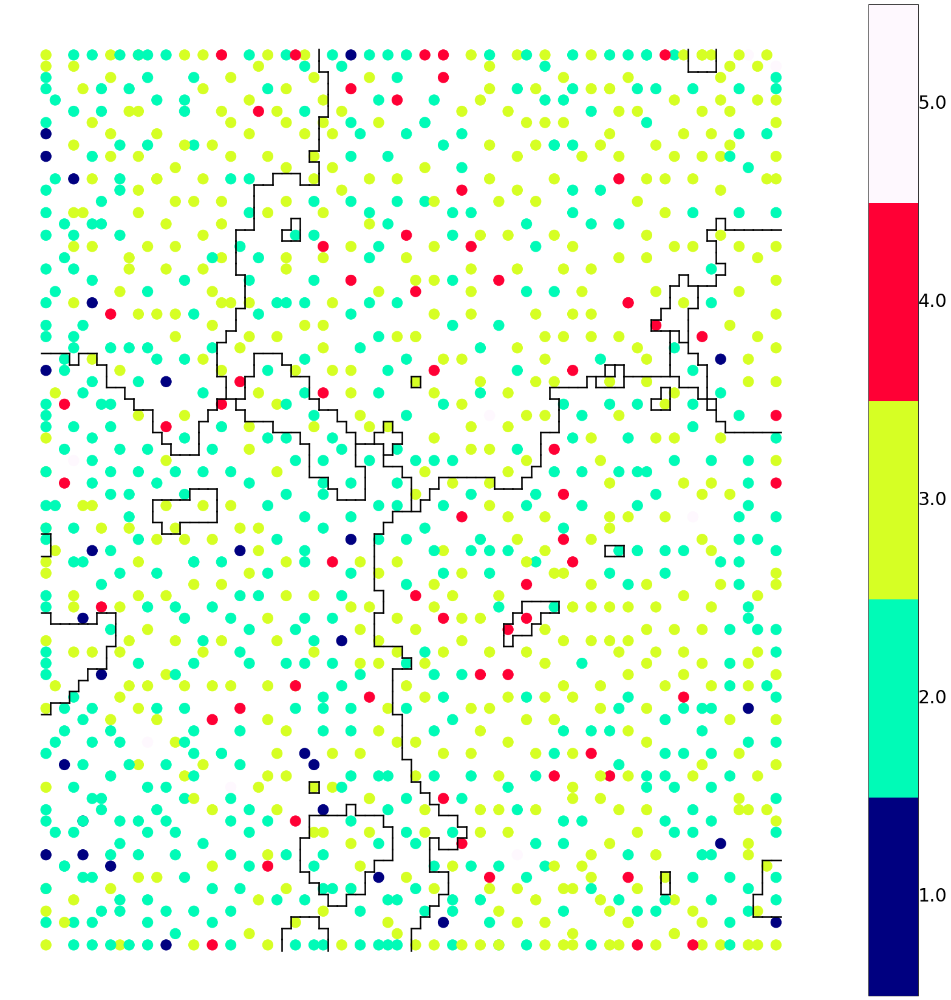

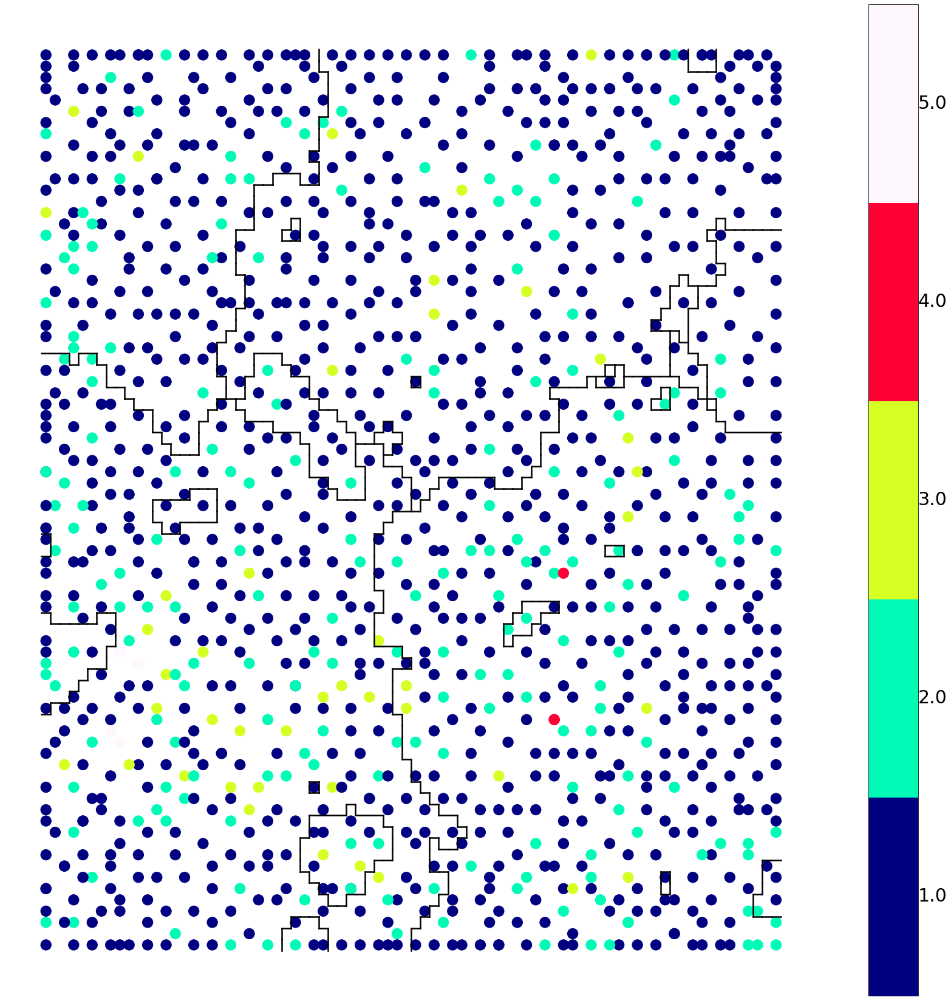

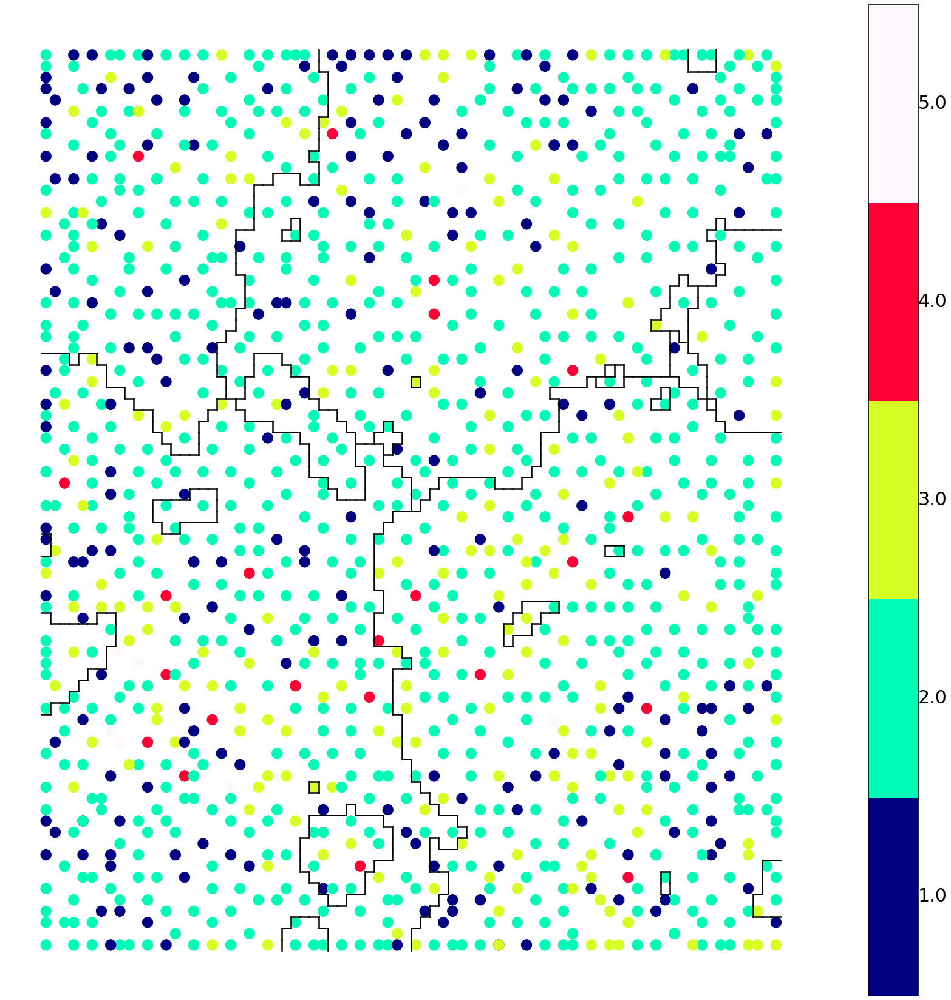

In [14]:
clusteringmap_category(sm,5,data,"n5Ring_Categ",'./Images/descriptors/Mw_HOMO/n5Ring_Categ.png')
clusteringmap_category(sm,5,data,"n6Ring_Categ",'./Images/descriptors/Mw_HOMO/n6Ring_Categ.png')
clusteringmap_category(sm,5,data,"nRing_Categ",'./Images/descriptors/Mw_HOMO/nRing_Categ.png')

# clusteringmap_category(sm,5,data,"PCE_Categ",'./Images/descriptors/Mw_HOMO/PCE_Categ.png')
# clusteringmap_category(sm,10,data,"Bandgap_Categ",'./Images/descriptors/Mw_HOMO/Bandgap_Categ.png')
# clusteringmap_category(sm,4,data,"DP_Categ",'./Images/descriptors/Mw_HOMO/DP_Categ.png')
# clusteringmap_category(sm,4,data,"PDI_Categ",'./Images/descriptors/Mw_HOMO/PDI_Categ.png')
# clusteringmap_category(sm,4,data,"nRot_Categ",'./Images/descriptors/Mw_HOMO/nRot_Categ.png')
# clusteringmap_category(sm,4,data,"Rotratio_Categ",'./Images/descriptors/Mw_HOMO/Rotratio_Categ.png')
# clusteringmap_category(sm,4,data,"TopoPSA_Categ",'./Images/descriptors/Mw_HOMO/TopoPSA_Categ.png')
# clusteringmap_category(sm,4,data,"TopoPSA(NO)_Categ",'./Images/descriptors/Mw_HOMO/TopoPSA(NO)_Categ.png')

locator: <matplotlib.ticker.FixedLocator object at 0x000001651954BF60>
Using fixed locator on colorbar
Setting pcolormesh
locator: <matplotlib.ticker.FixedLocator object at 0x0000016518C82940>
Using fixed locator on colorbar
Setting pcolormesh


array([0, 0, 0, ..., 2, 2, 2])

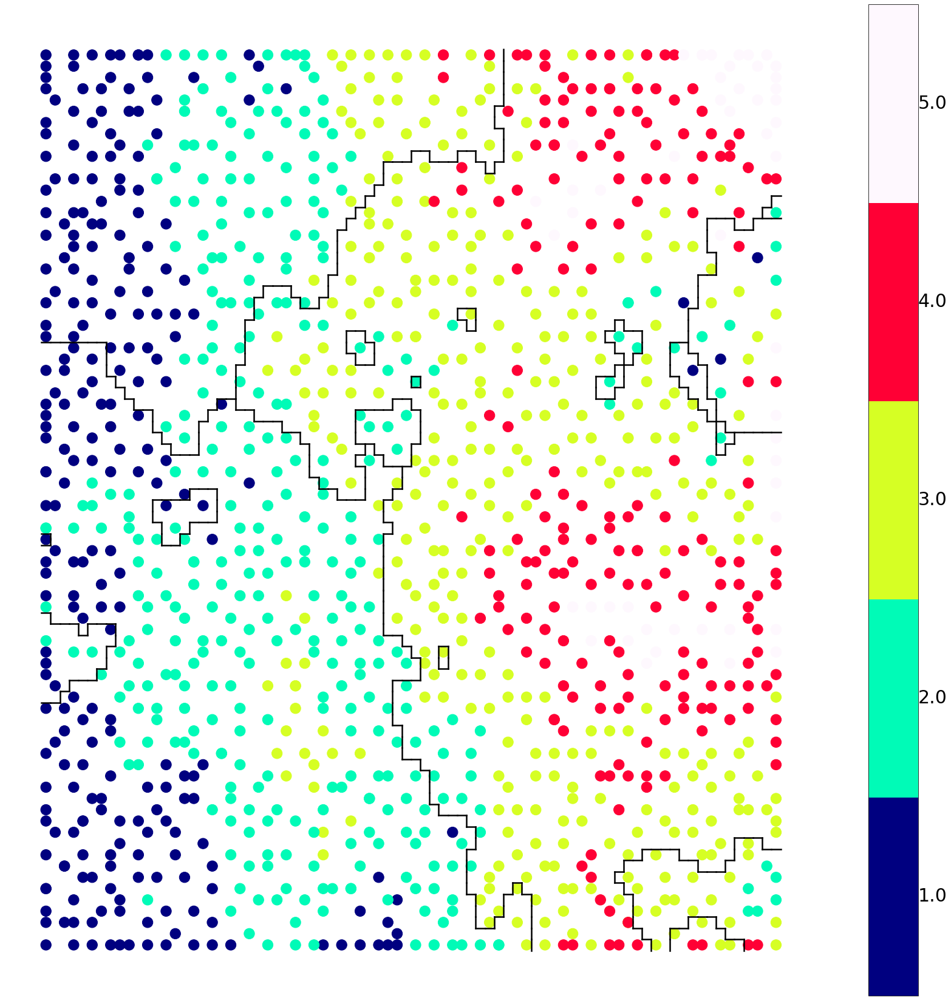

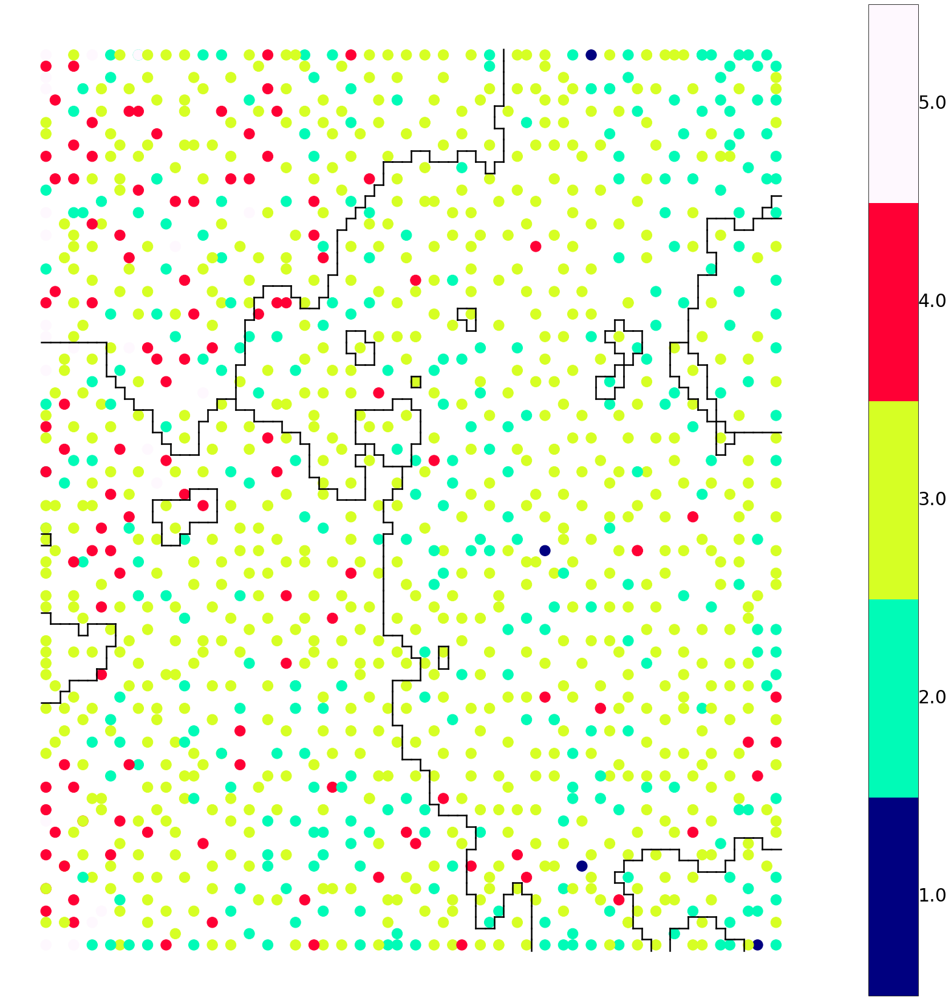

In [30]:
clusteringmap_category(sm,4,data,"PCE_Categ",'./Images/descriptors/Mw_HOMO/PCE_Categ_5_HOMO_Mw.png')
clusteringmap_category(sm,4,data,"Eloss_Categ",'./Images/descriptors/Mw_HOMO/E_loss_Categ2.png')

In [41]:
# 247 points in high PCE_regions
len(data[data['PCE_Categ'] == 4.0]) + len(data[data['PCE_Categ'] == 5.0])

247

In [64]:
# with nF > 0
high_PCE_4 = data[data['PCE_Categ'] == 4.0]
high_PCE_5 = data[data['PCE_Categ'] == 5.0]

len(high_PCE_4[high_PCE_4['nF'] > 0]) + len(high_PCE_5[high_PCE_5['nF'] > 0])

109

In [75]:
# 247 materials in high PCE regions, 109 of them have at least 1 nF
nF_2 = len(data[data['nF'] >= 2]) # 23 materials have more than 1 F atom
nF_1 = len(data[data['nF'] >= 1]) - nF_2 # 153 materials have more than 1 F atom
nF_0 = len(data[data['nF'] > 0]) # 254 materials have at least 1 F atom
nF_0

254

In [76]:
109 / 247
254 / 1203

0.2111388196176226

In order to check whether fluroine (F) serves an important role in enhancing PCE, we can check its coverage percentage. 

Compare to S, N, O, F has a more intentional distribution across the map. While non-fluorine group generally exists for every material. Fluroine atoms, especially F (Br and Cl barely exists). There are 109 materials with nF > 0 in high PCE regions, which occupies 44% of high PCE materials

D:\2019\SOMProject\tfprop_sompy_Re\images_gen.py:28: RuntimeWarning: invalid value encountered in longlong_scalars
  norm = (data[prop].iloc[i]-min_value)/(max_value - min_value)
locator: <matplotlib.ticker.FixedLocator object at 0x0000016520F9AD68>
Using fixed locator on colorbar
Setting pcolormesh
locator: <matplotlib.ticker.FixedLocator object at 0x000001651E8699E8>
Using fixed locator on colorbar
Setting pcolormesh
locator: <matplotlib.ticker.FixedLocator object at 0x0000016525619D30>
Using fixed locator on colorbar
Setting pcolormesh
locator: <matplotlib.ticker.FixedLocator object at 0x000001651EA0F828>
Using fixed locator on colorbar
Setting pcolormesh
locator: <matplotlib.ticker.FixedLocator object at 0x000001651E5F5B38>
Using fixed locator on colorbar
Setting pcolormesh


ValueError: nan is not in list

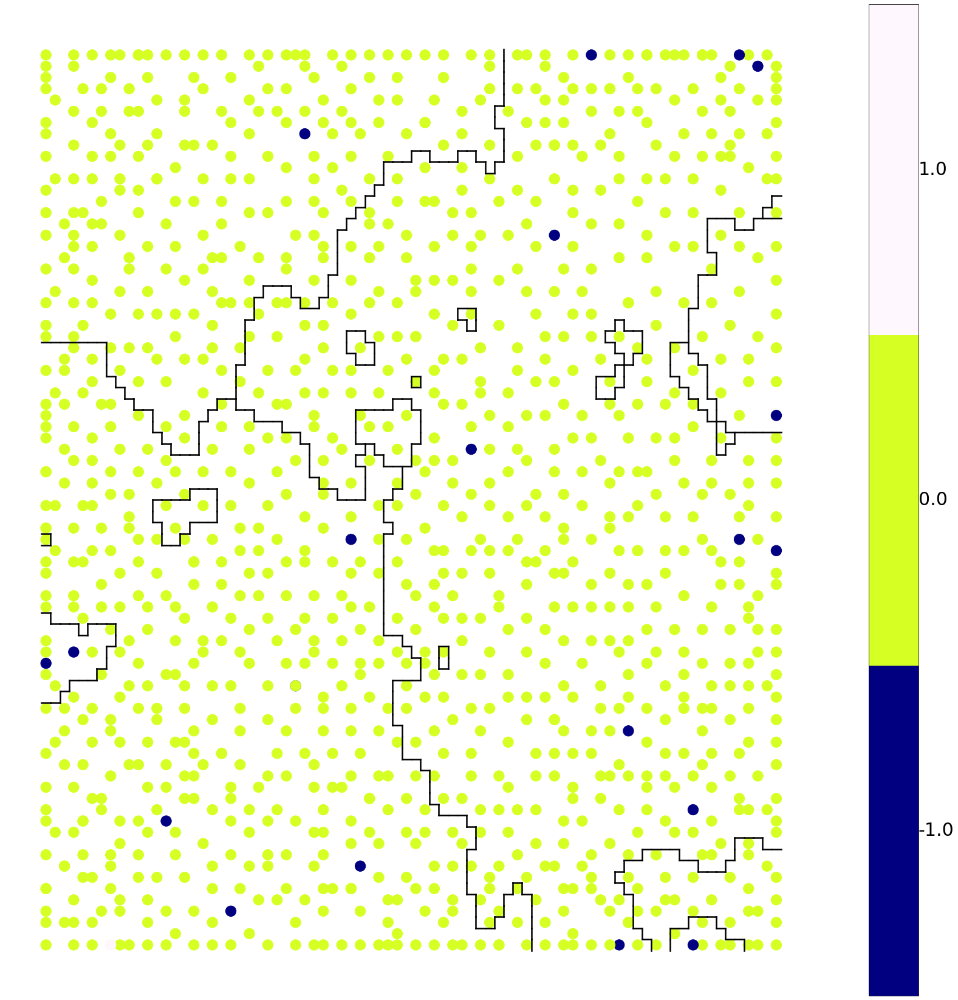

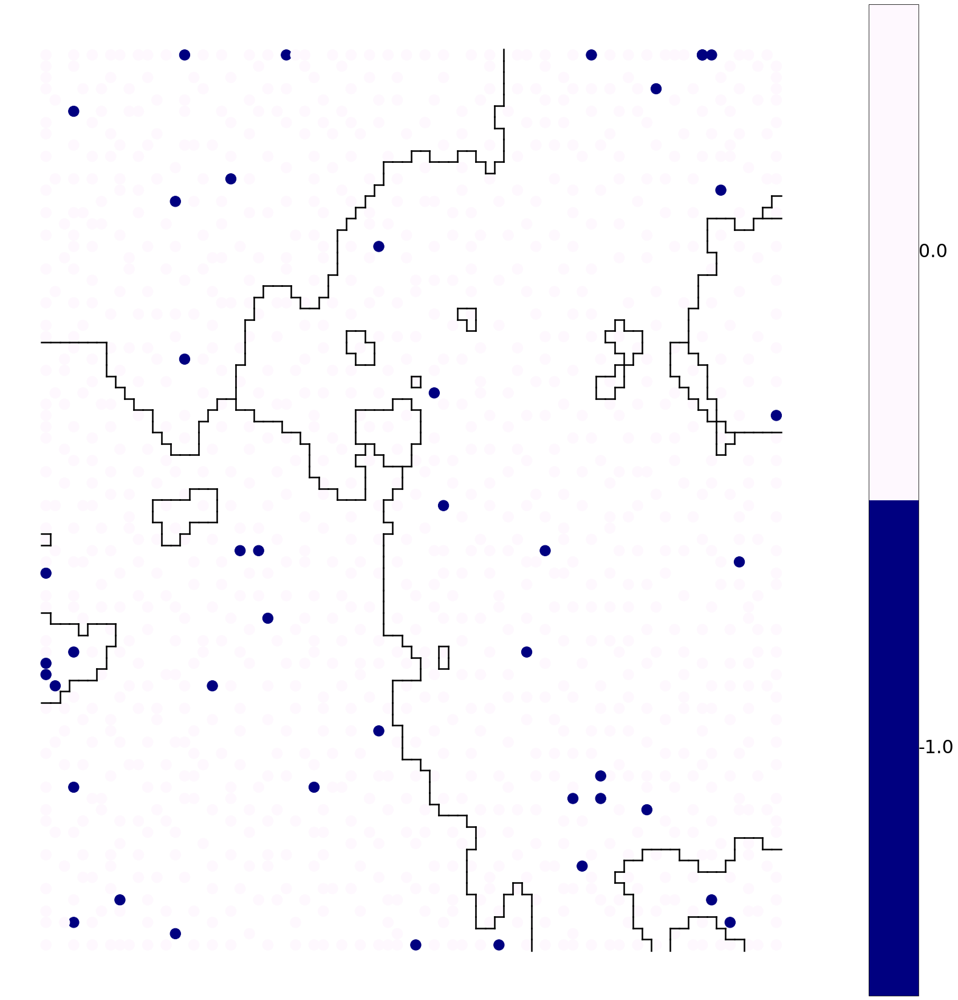

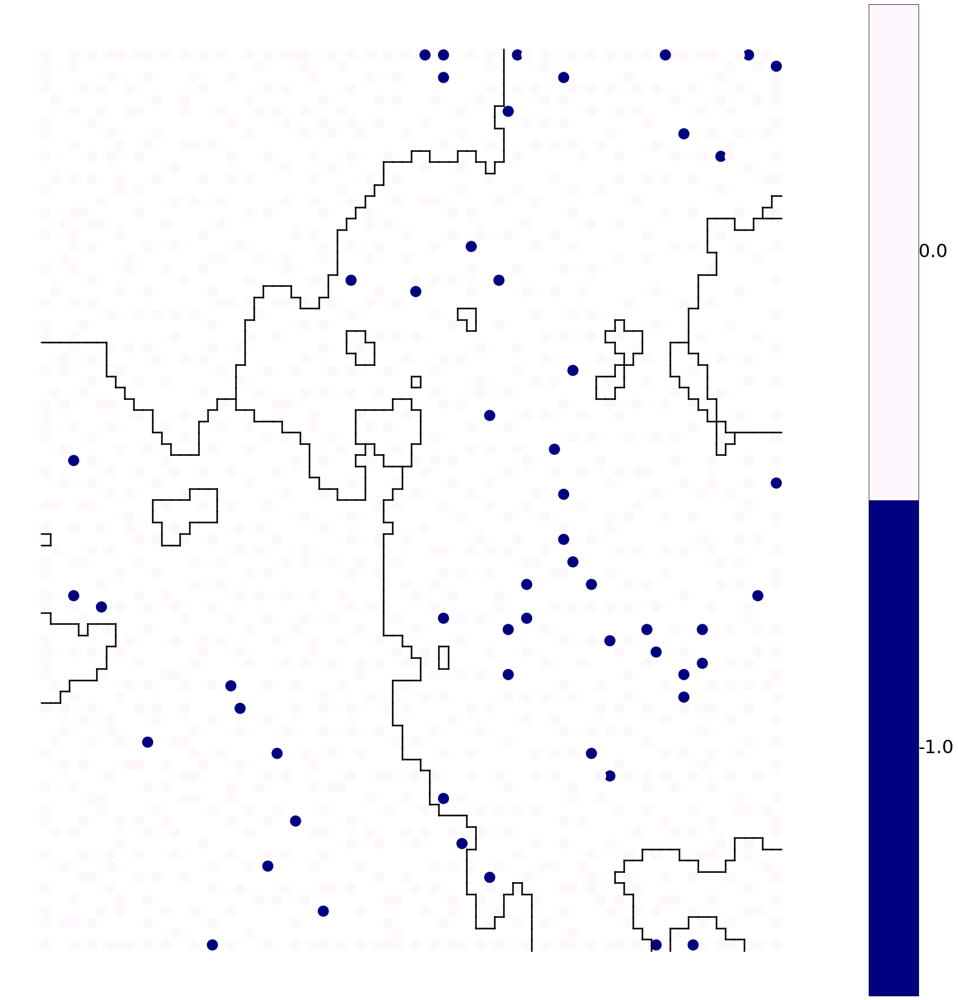

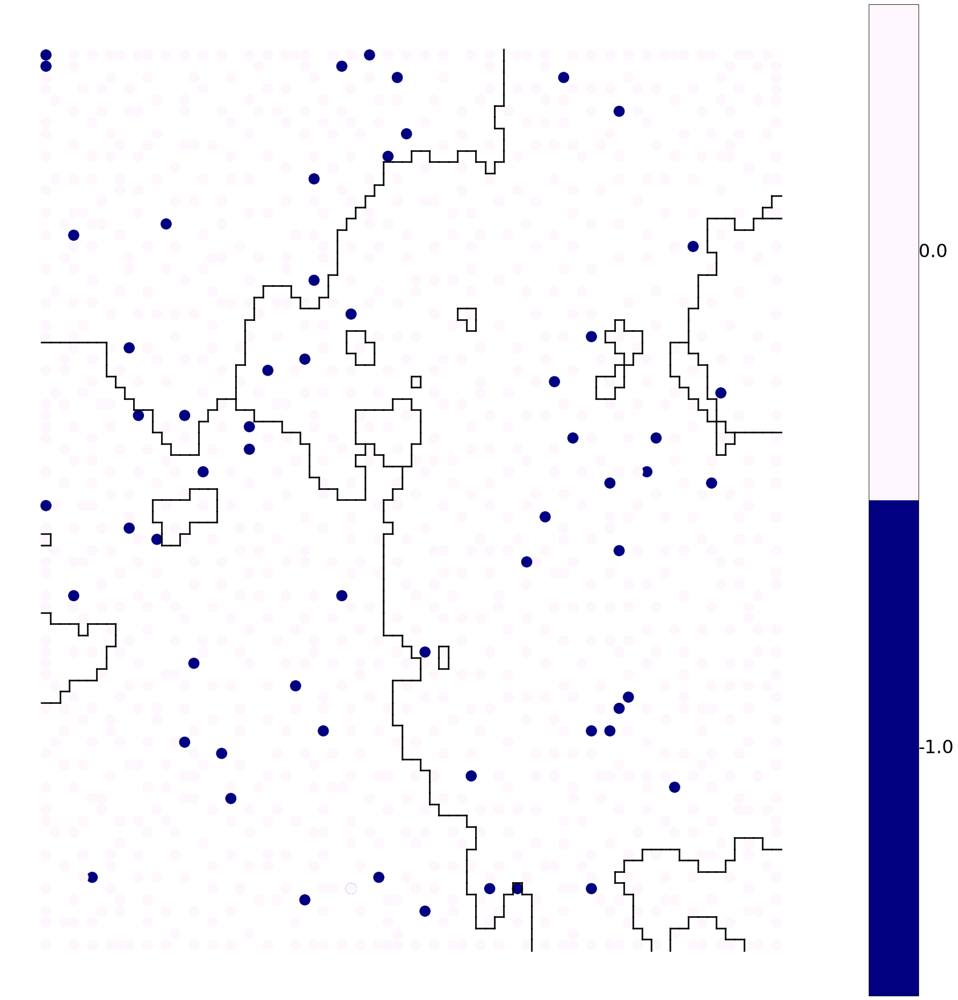

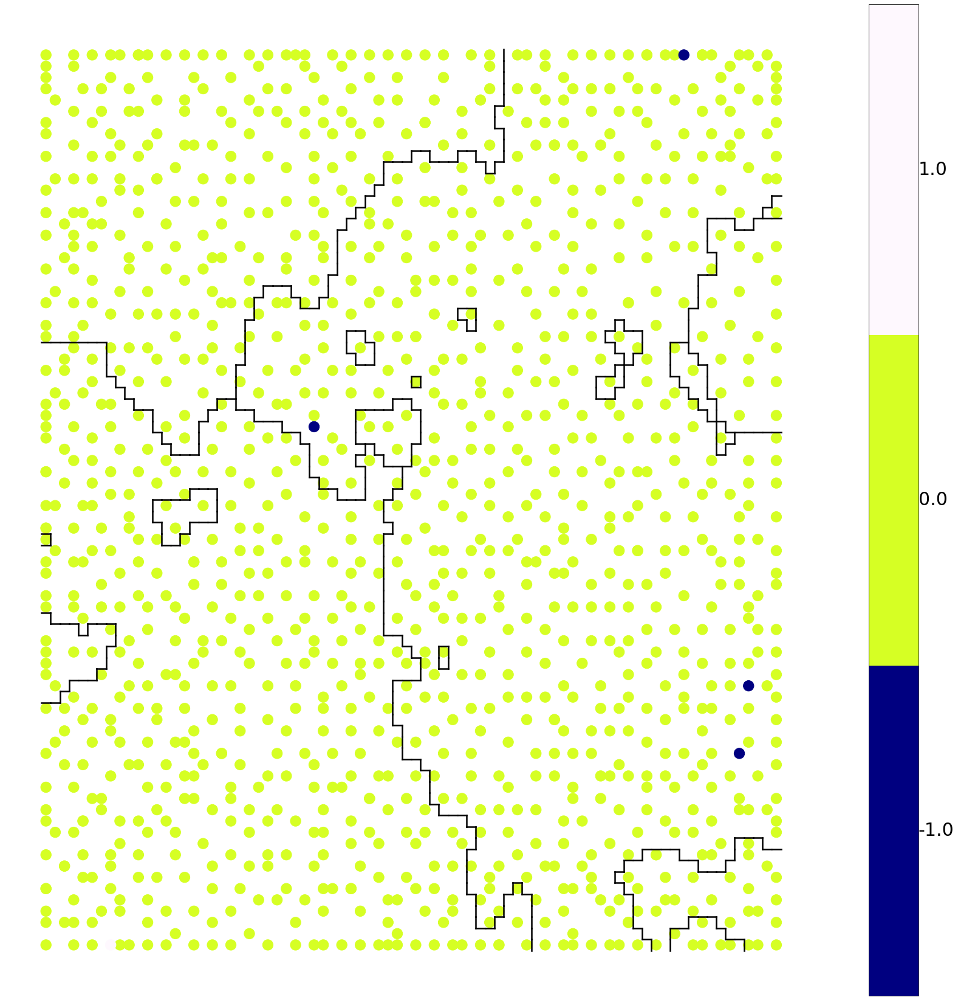

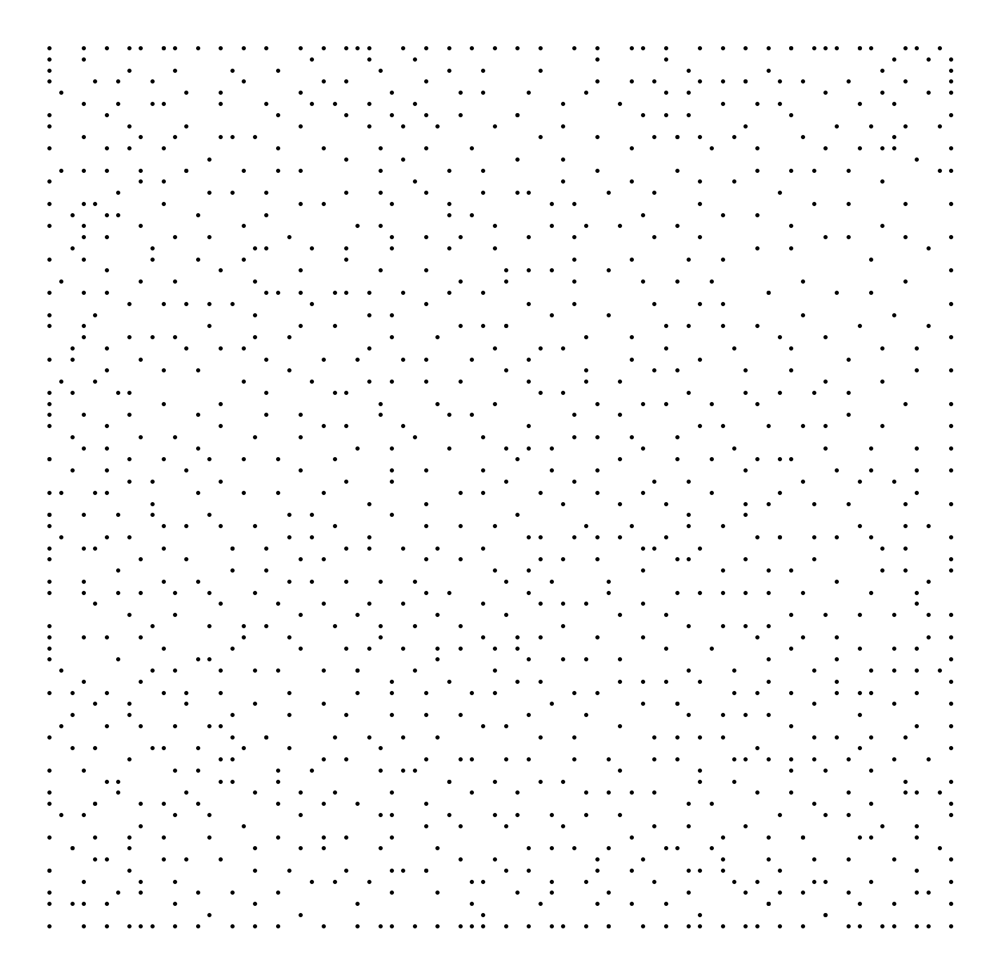

In [16]:
data['nN_Categ'] = classify_by_group(data,'nN',2)
data['nS_Categ'] = classify_by_group(data,'nS',2)
data['nO_Categ'] = classify_by_group(data,'nO',2)
data['nCl_Categ'] = classify_by_group(data,'nCl',2)
data['nBr_Categ'] = classify_by_group(data,'nBr',2)
# data['nX_Categ'] = classify_by_group(data,'nX',2)
data['nF_Categ'] = classify_by_group(data,'nF',2)

data['nN_re'] = 1 - data['nN_Categ']
data['nS_re'] = 1 - data['nS_Categ']
data['nO_re'] = 1 - data['nO_Categ']
# data['nX_re'] = 1 - data['nX_Categ']
data['nCl_re'] = 1 - data['nCl_Categ']
data['nBr_re'] = 1 - data['nBr_Categ']
data['nF_re'] = 1 - data['nF_Categ']

clusteringmap_category(sm,4,data,"nF_re",'./Images/descriptors/Mw_HOMO/nF_Categ_Mw_HOMO.png')
clusteringmap_category(sm,4,data,"nN_re",'./Images/descriptors/Mw_HOMO/nN_Categ_Mw_HOMO.png')
clusteringmap_category(sm,4,data,"nS_re",'./Images/descriptors/Mw_HOMO/nS_Categ_Mw_HOMO.png')
clusteringmap_category(sm,4,data,"nO_re",'./Images/descriptors/Mw_HOMO/nO_Categ_Mw_HOMO.png')
# clusteringmap_category(sm,4,data,"nX_re",'./Images/descriptors/Mw_HOMO/nX_Categ_Mw_HOMO.png')
clusteringmap_category(sm,4,data,"nCl_re",'./Images/descriptors/Mw_HOMO/nCl_Categ_Mw_HOMO.png')
clusteringmap_category(sm,4,data,"nBr_re",'./Images/descriptors/Mw_HOMO/nBr_Categ_Mw_HOMO.png')

locator: <matplotlib.ticker.FixedLocator object at 0x00000165222F4EF0>
Using fixed locator on colorbar
Setting pcolormesh
locator: <matplotlib.ticker.FixedLocator object at 0x0000016523D588D0>
Using fixed locator on colorbar
Setting pcolormesh
locator: <matplotlib.ticker.FixedLocator object at 0x0000016517FDE278>
Using fixed locator on colorbar
Setting pcolormesh
locator: <matplotlib.ticker.FixedLocator object at 0x000001651E5C5940>
Using fixed locator on colorbar
Setting pcolormesh
locator: <matplotlib.ticker.FixedLocator object at 0x0000016524D28C88>
Using fixed locator on colorbar
Setting pcolormesh


ValueError: nan is not in list

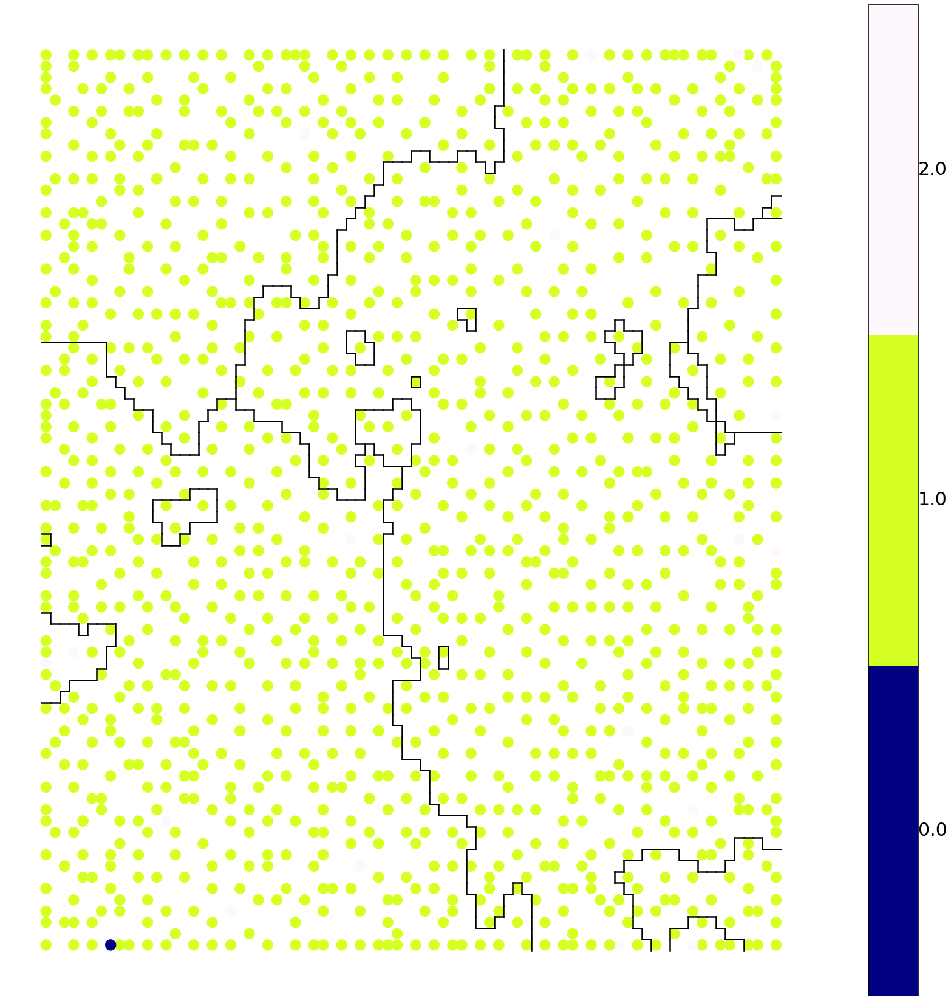

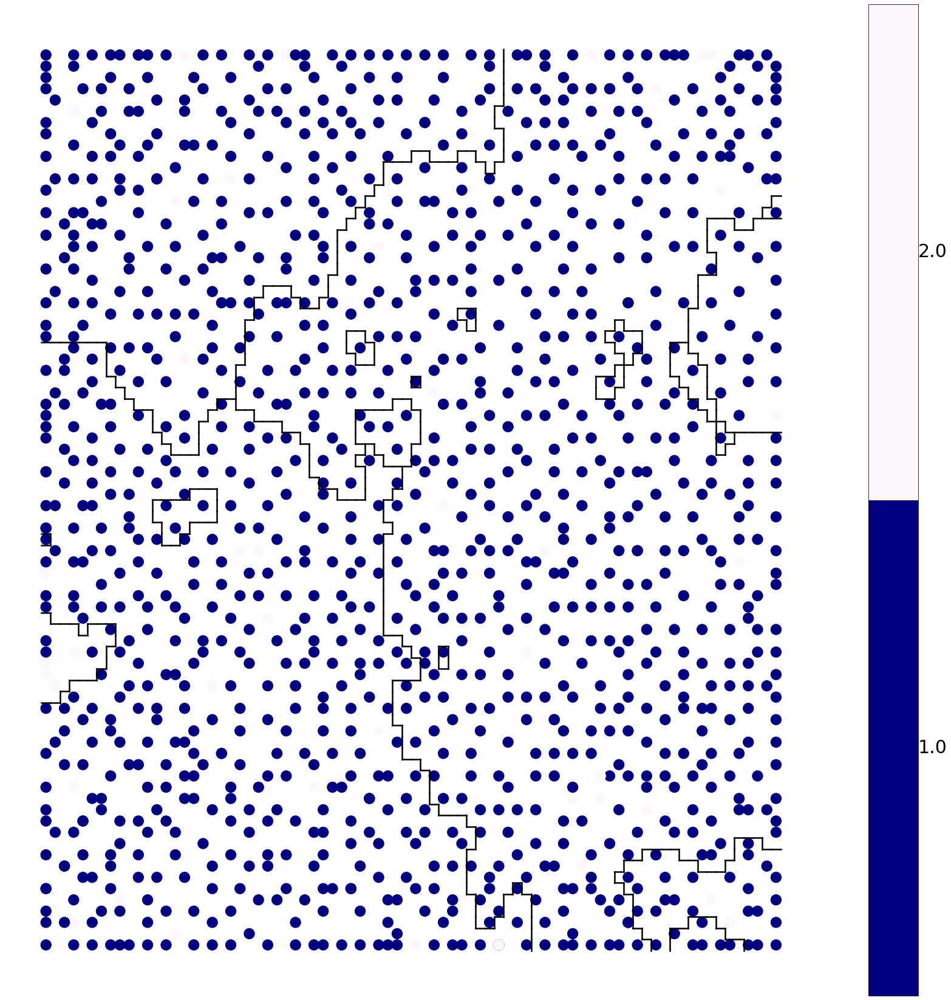

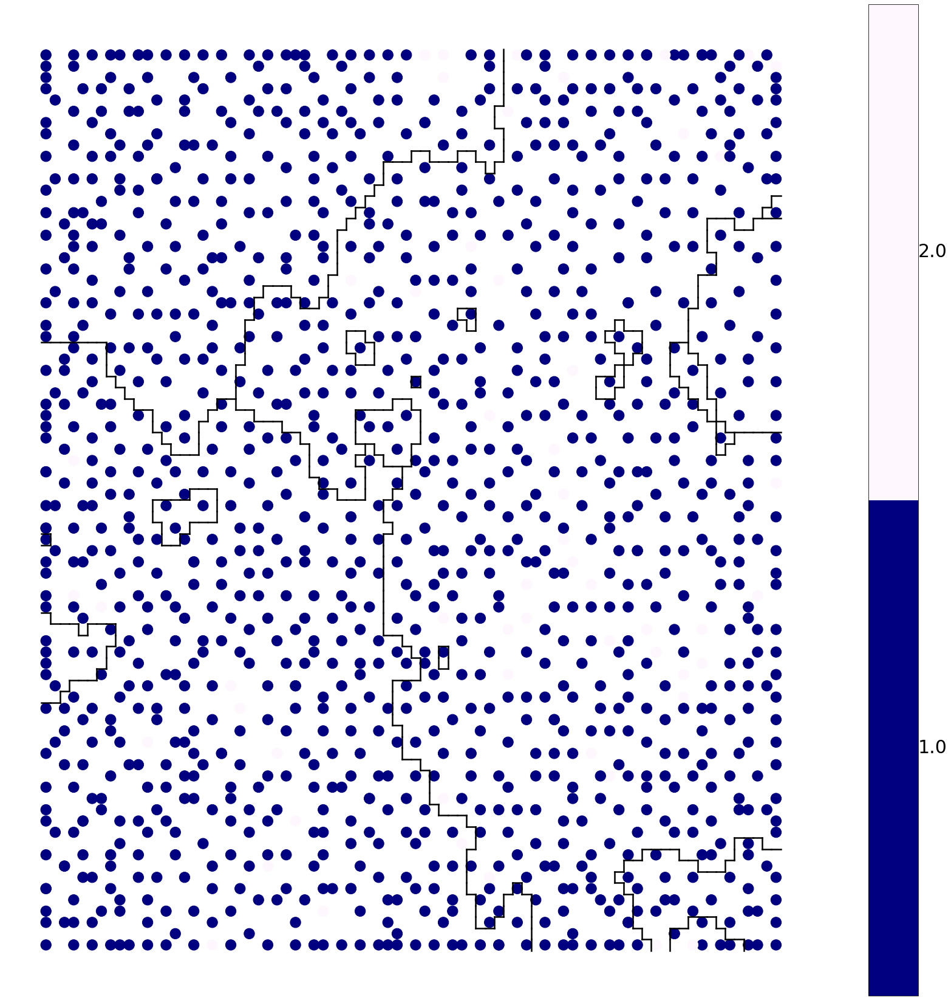

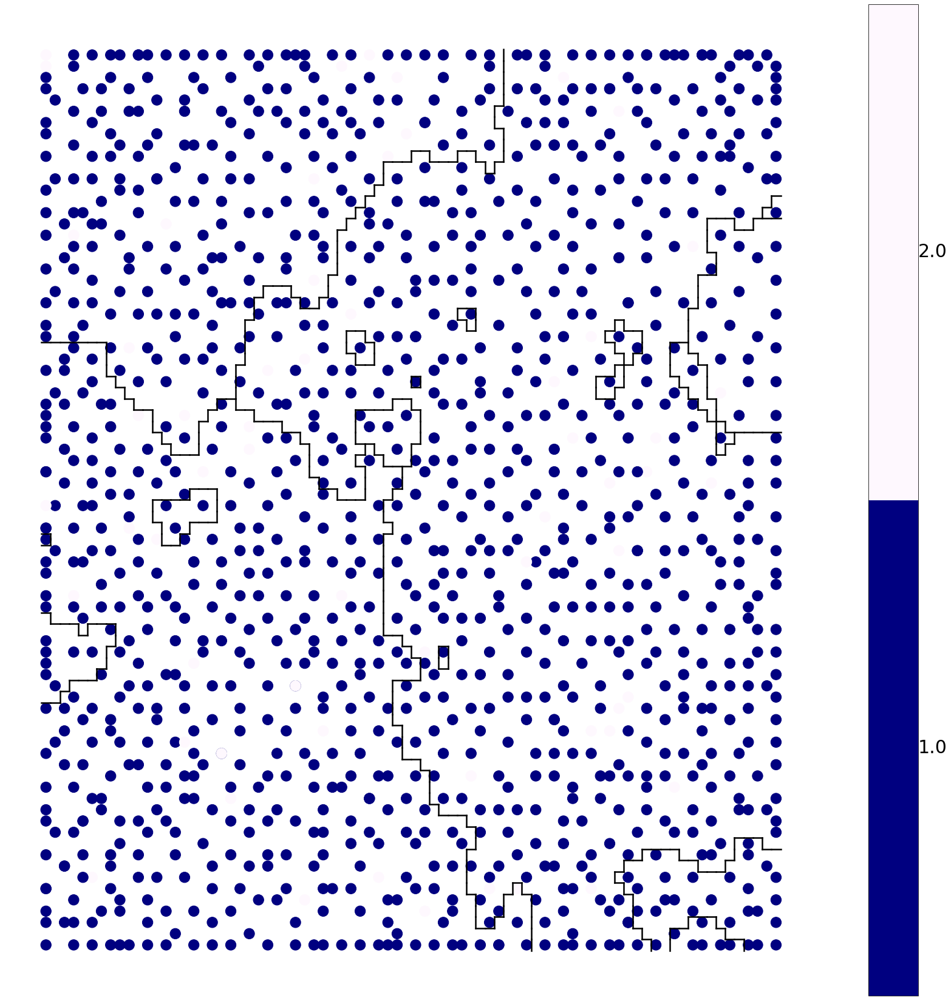

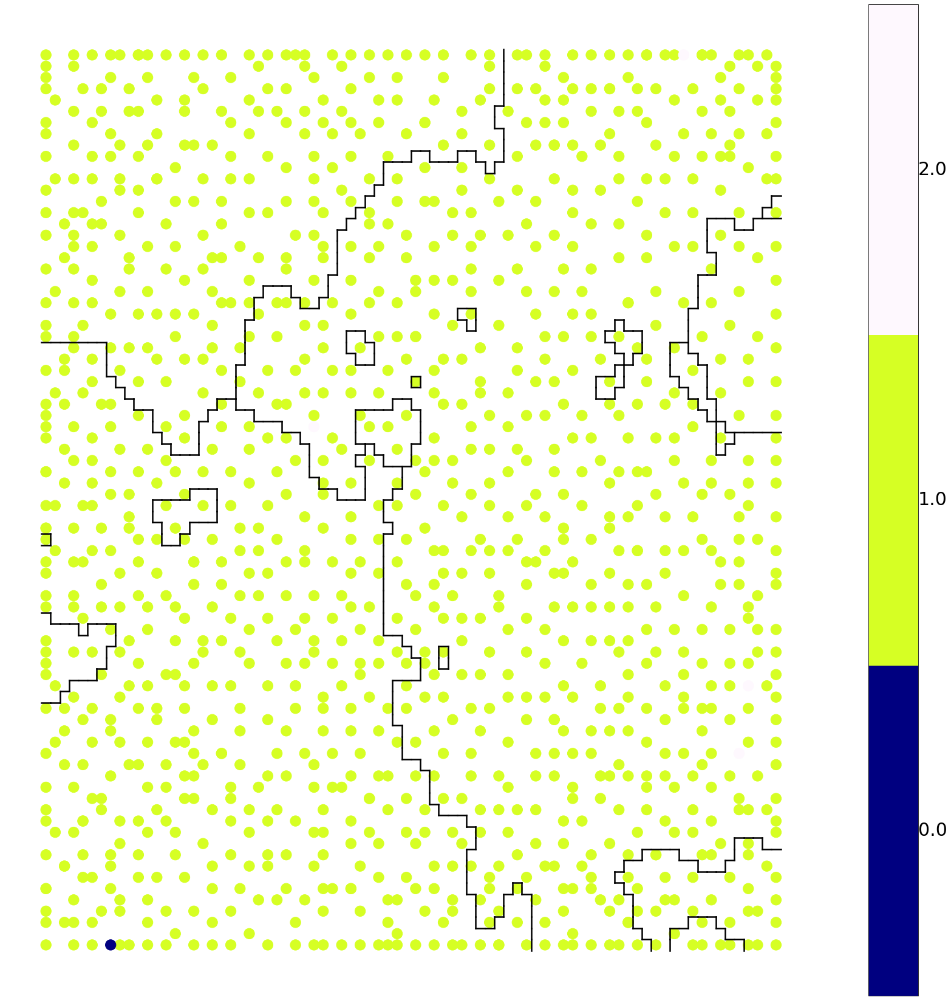

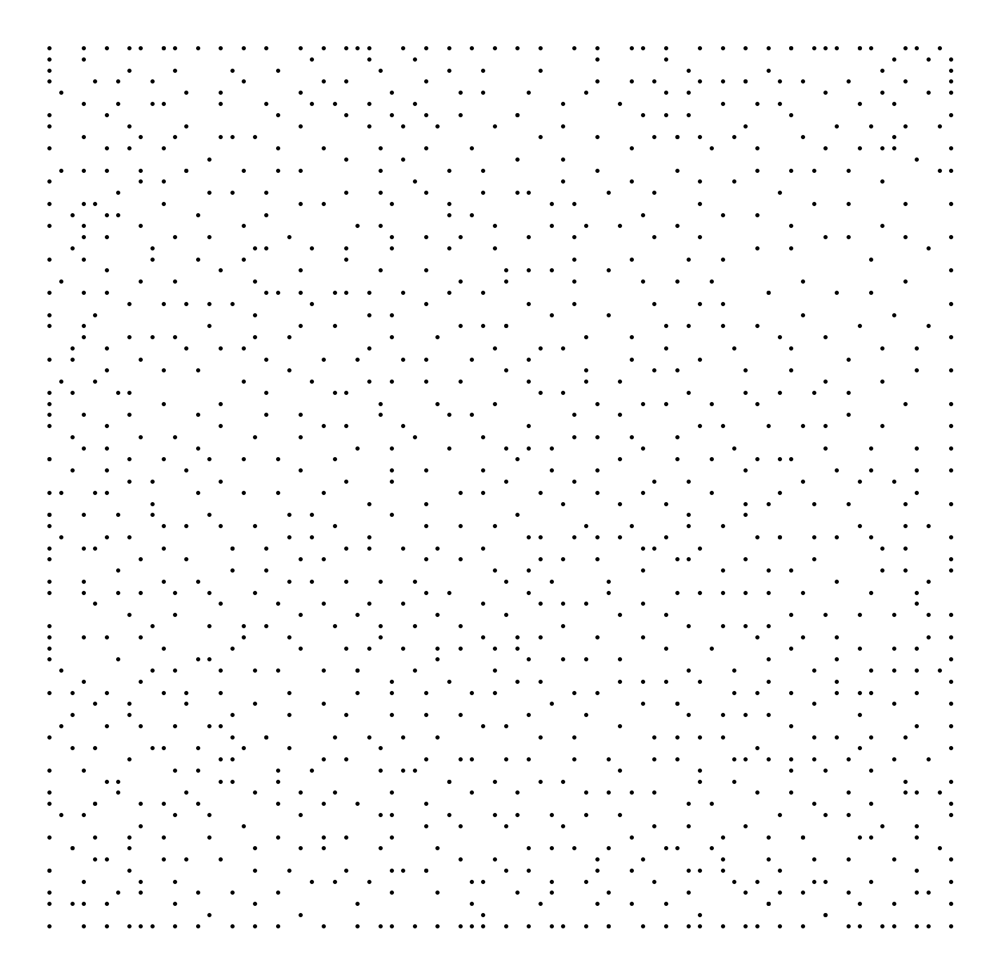

In [17]:
clusteringmap_category(sm,4,data,"nF_Categ",'./Images/descriptors/Mw_HOMO/nF_Categ_Mw_HOMO.png')
clusteringmap_category(sm,4,data,"nN_Categ",'./Images/descriptors/Mw_HOMO/nN_Categ_Mw_HOMO.png')
clusteringmap_category(sm,4,data,"nS_Categ",'./Images/descriptors/Mw_HOMO/nS_Categ_Mw_HOMO.png')
clusteringmap_category(sm,4,data,"nO_Categ",'./Images/descriptors/Mw_HOMO/nO_Categ_Mw_HOMO.png')
# clusteringmap_category(sm,4,data,"nX_re",'./Images/descriptors/Mw_HOMO/nX_Categ_Mw_HOMO.png')
clusteringmap_category(sm,4,data,"nCl_Categ",'./Images/descriptors/Mw_HOMO/nCl_Categ_Mw_HOMO.png')
clusteringmap_category(sm,4,data,"nBr_Categ",'./Images/descriptors/Mw_HOMO/nBr_Categ_Mw_HOMO.png')

locator: <matplotlib.ticker.FixedLocator object at 0x0000012C28BB3BE0>
Using fixed locator on colorbar
Setting pcolormesh
locator: <matplotlib.ticker.FixedLocator object at 0x0000012C288E6A58>
Using fixed locator on colorbar
Setting pcolormesh
locator: <matplotlib.ticker.FixedLocator object at 0x0000012C27FA7860>
Using fixed locator on colorbar
Setting pcolormesh


array([0, 0, 0, ..., 2, 2, 2])

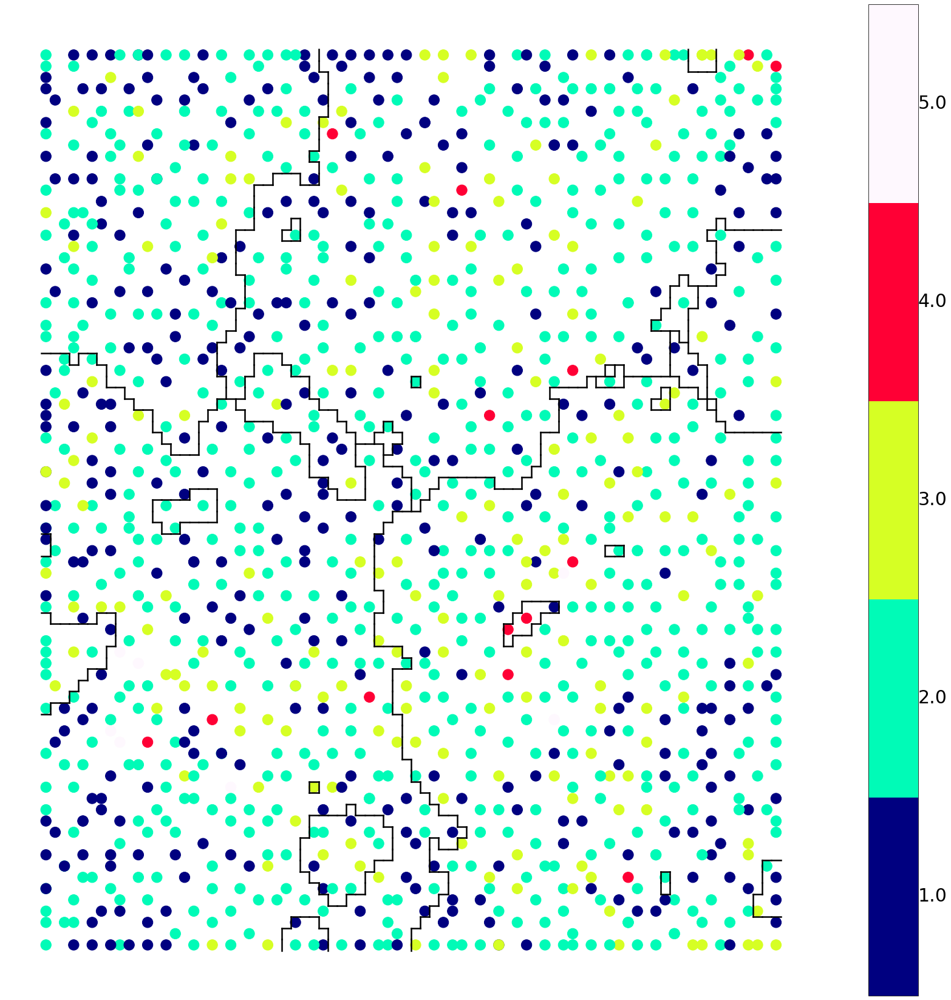

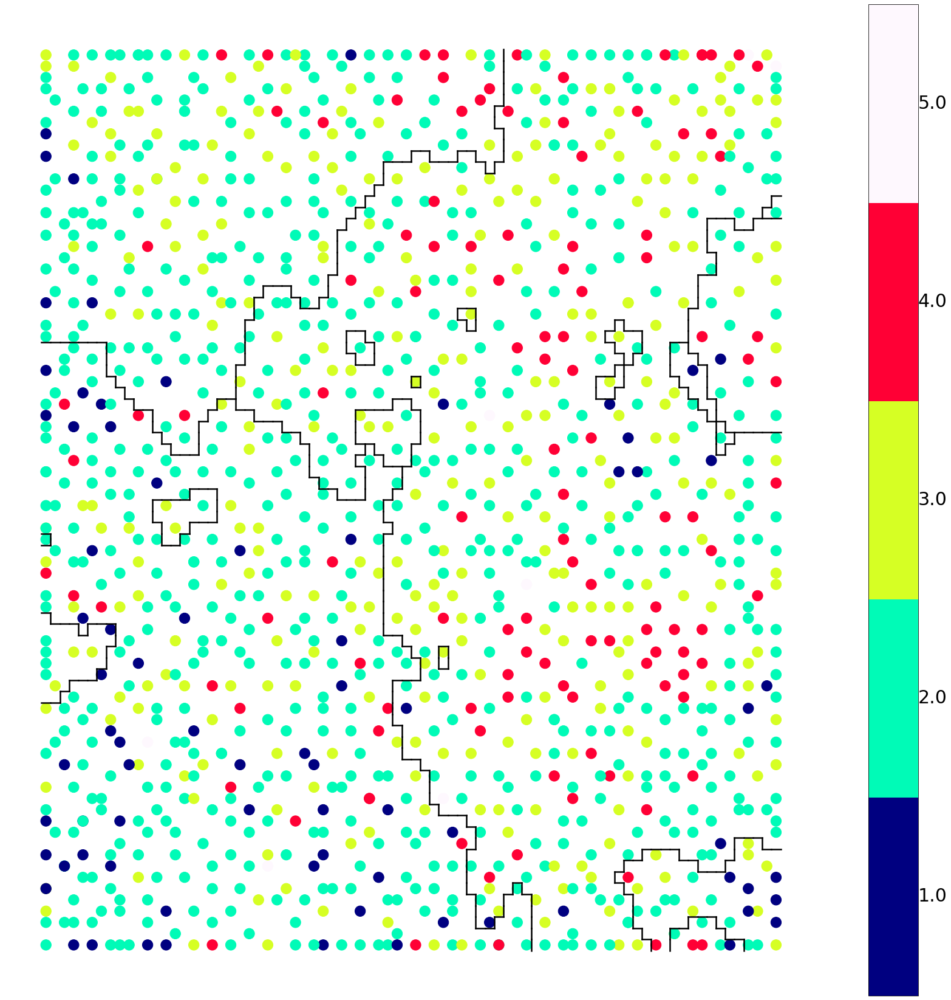

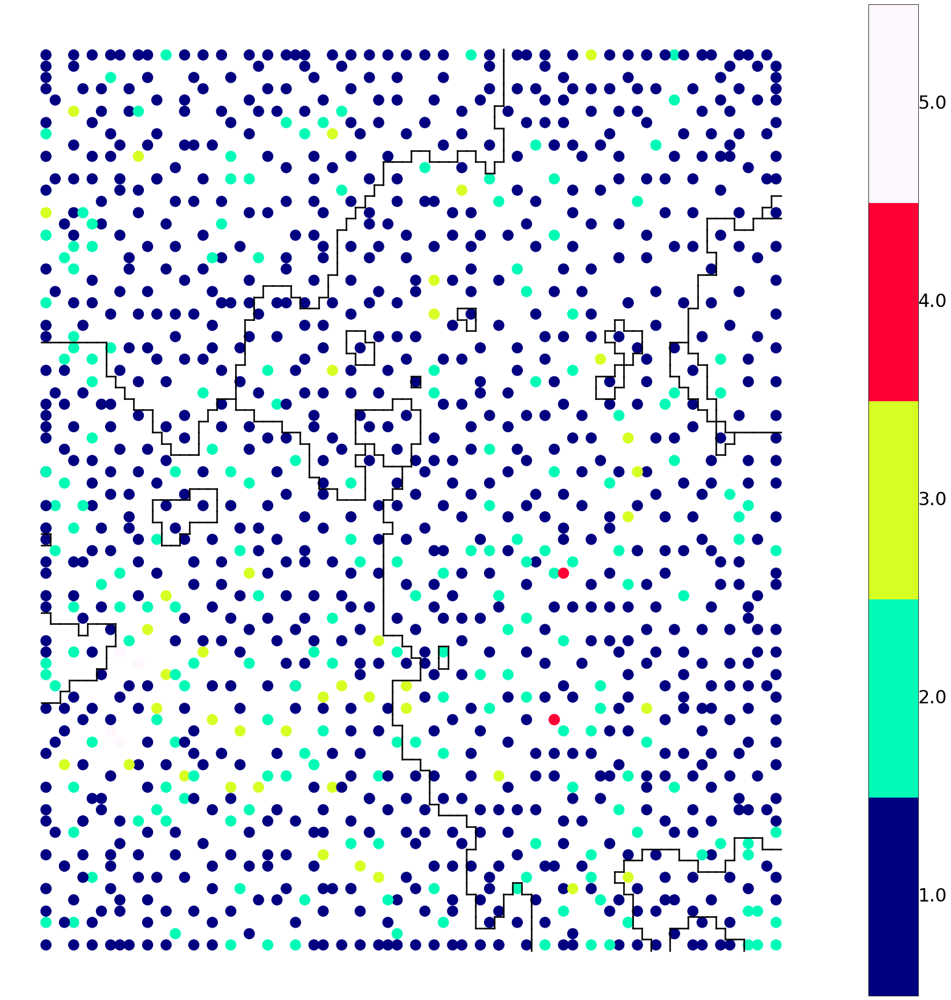

In [112]:
# naRing 1 - 21
data['naRing_Categ'] = classify_by_group(data,"naRing",5)
clusteringmap_category(sm,5,data,"naRing_Categ",'./Images/descriptors/Mw_HOMO/naRing_Categ.png')

# n5Ring 0 - 13
data['n5aRing_Categ'] = classify_by_group(data,"n5aRing",5)
clusteringmap_category(sm,4,data,"n5aRing_Categ",'./Images/descriptors/Mw_HOMO/n5aRing_Categ.png')

# n6aRing 0 - 17
data['n6aRing_Categ'] = classify_by_group(data,"n6aRing",5)
clusteringmap_category(sm,4,data,"n6aRing_Categ",'./Images/descriptors/Mw_HOMO/n6aRing_Categ.png')

In [12]:
def sort_by_range(data, min_val, max_val, prop, Categ):
    """
    This function gives values between min and max as 0
    values outside as 1
    """
    ls = []
    df_categ = data[Categ]
    for i in range(len(data[prop])):
        if max_val >= data[prop].iloc[i] >= min_val:
            df_categ.iloc[i] = 0
        else:
            df_categ.iloc[i]  = 1
        ls.append(df_categ.iloc[i])
    return ls

In [113]:
data = pd.read_csv("./data/compdata_classification_des.csv")
# data['n5aRing_Categ'] = classify_by_group(data,"n5aRing",5)

# data['n5aRing3'] = sort_by_range(data,3,3,"n5aRing_Categ","n5aRing_Categ")
# data['n5aRing4'] = sort_by_range(data,4,4,"n5aRing_Categ","n5aRing_Categ")
# data['n5aRing34'] = sort_by_range(data,3,4,"n5aRing_Categ","n5aRing_Categ")
# data['n5aRing2'] = sort_by_range(data,2,2,"n5aRing_Categ","n5aRing_Categ")

C:\Users\jtz93\Anaconda3\envs\SOMenv\lib\site-packages\IPython\core\interactiveshell.py:3044: DtypeWarning: Columns (97,98,99,100,101,102,103,104,105,304,305,306,307,308,309,310,311,312,412,413,414,415,416,417,418,419,420,517,518,519,520,521,522,523,524,613,614,615,616,617,618,619,620,687,688,689,690,691,692,693,694,695,696,697,698,699,700,701,702,703,704,705,706,707,708,710,711,712,713,714,715,716,717,718,719,720,721,722,723,724,725,726,727,728,729,730,731,732,733,734,735,736,737,738,739,740,741,742,743,744,745,746,747,748,749,750,751,752,753,754,755,756,757,758,759,760,761,762,763,764,765,766,767,768,769,770,771,772,773,774,775,776,777,778,779,780,781,782,783,784,785,786,787,788,789,790,791,792,793,794,795,796,797,798,799,800,801,802,803,804,805,806,807,808,809,810,811,812,813,861,869,877,885,909,910,911,912,913,914,915,916,917,918,919,920,921,922,923,924,925,926,927,928,929,930,931,932,933,934,1093,1096,1097,1098,1099,1100,1101,1102,1103,1104,1105,1106,1107,1108,1109,1110,1111,1112,

locator: <matplotlib.ticker.FixedLocator object at 0x0000012C2852E048>
Using fixed locator on colorbar
Setting pcolormesh
locator: <matplotlib.ticker.FixedLocator object at 0x0000012C28F97BE0>
Using fixed locator on colorbar
Setting pcolormesh
locator: <matplotlib.ticker.FixedLocator object at 0x0000012C27F58F28>
Using fixed locator on colorbar
Setting pcolormesh


ZeroDivisionError: division by zero

Error in callback <function install_repl_displayhook.<locals>.post_execute at 0x0000012C63D41950> (for post_execute):


ZeroDivisionError: division by zero

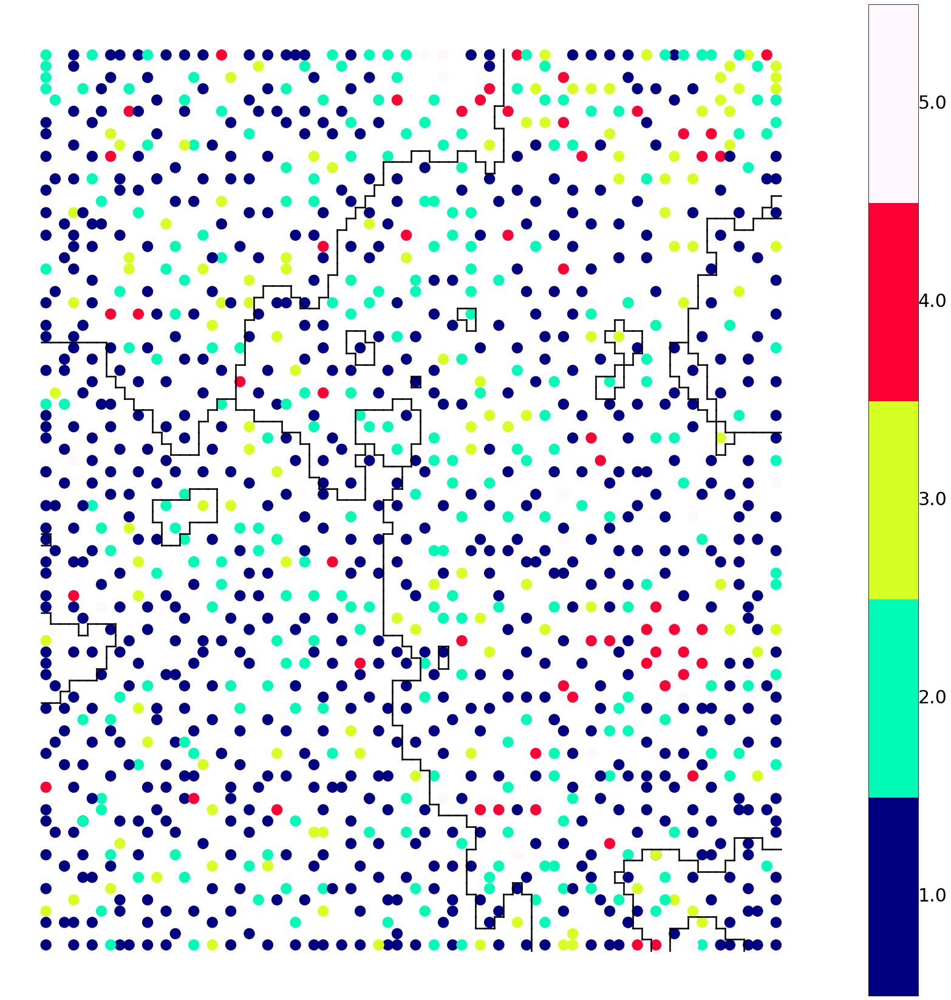

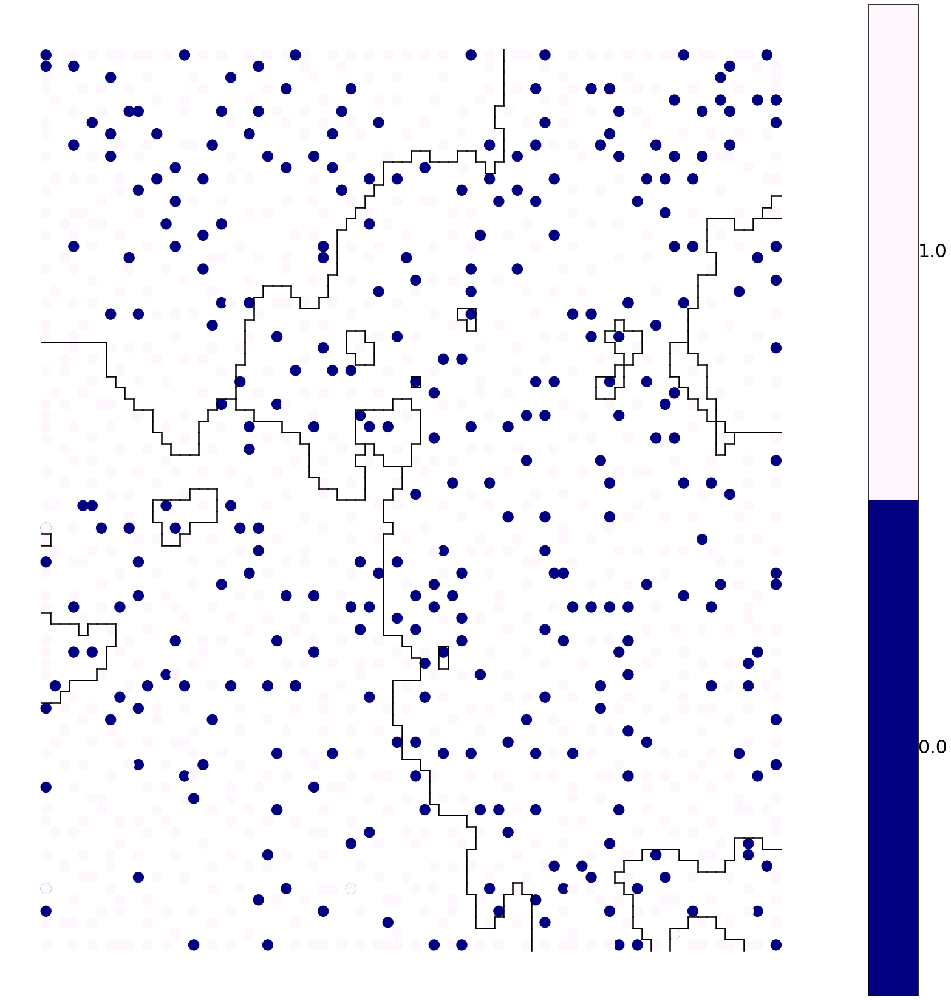

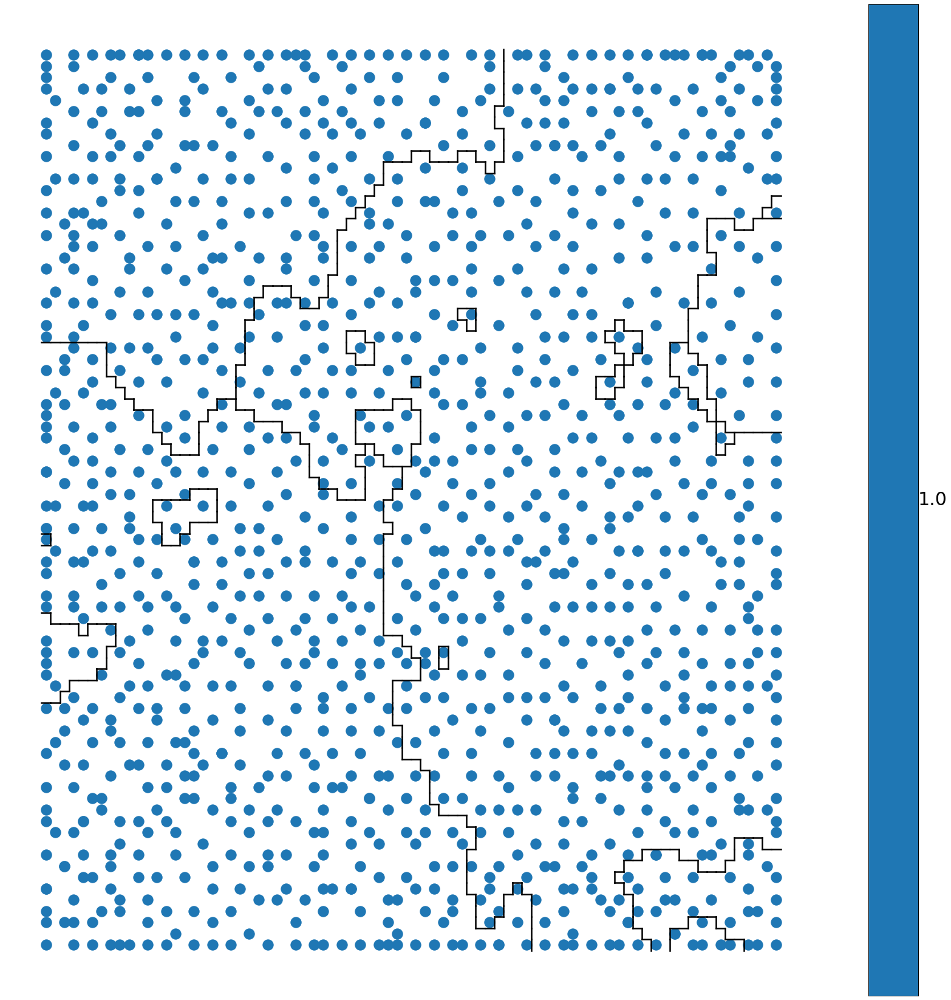

In [82]:
data['naRing5by6_Categ'] = classify_by_group(data,"naRing5by6",5)

clusteringmap_category(sm,4,data,"naRing5by6_Categ",'./Images/descriptors/Mw_HOMO/naRing5by6_Categ.png')
clusteringmap_category(sm,4,data,"n5aRing3",'./Images/descriptors/Mw_HOMO/n5aRing3.png')
clusteringmap_category(sm,4,data,"n5aRing4",'./Images/descriptors/Mw_HOMO/n5aRing4.png')
clusteringmap_category(sm,4,data,"n5aRing34",'./Images/descriptors/Mw_HOMO/n5aRing34.png')

In [ ]:
# data['naRing5by624'] = sort_by_range(data,2,4,"naRing5by6_Categ","naRing5by6_Categ")
data['naRing5by623'] = sort_by_range(data,2,3,"naRing5by6_Categ","naRing5by6_Categ")
data['naRing5by634'] = sort_by_range(data,3,4,"naRing5by6_Categ","naRing5by6_Categ")

# clusteringmap_category(sm,4,data,"naRing5by624",'./Images/descriptors/Mw_HOMO/naRing5by624.png')
clusteringmap_category(sm,4,data,"naRing5by623",'./Images/descriptors/Mw_HOMO/naRing5by623.png')
clusteringmap_category(sm,4,data,"naRing5by634",'./Images/descriptors/Mw_HOMO/naRing5by634.png')

locator: <matplotlib.ticker.FixedLocator object at 0x0000012C292CAE10>
Using fixed locator on colorbar
Setting pcolormesh


array([0, 0, 0, ..., 2, 2, 2])

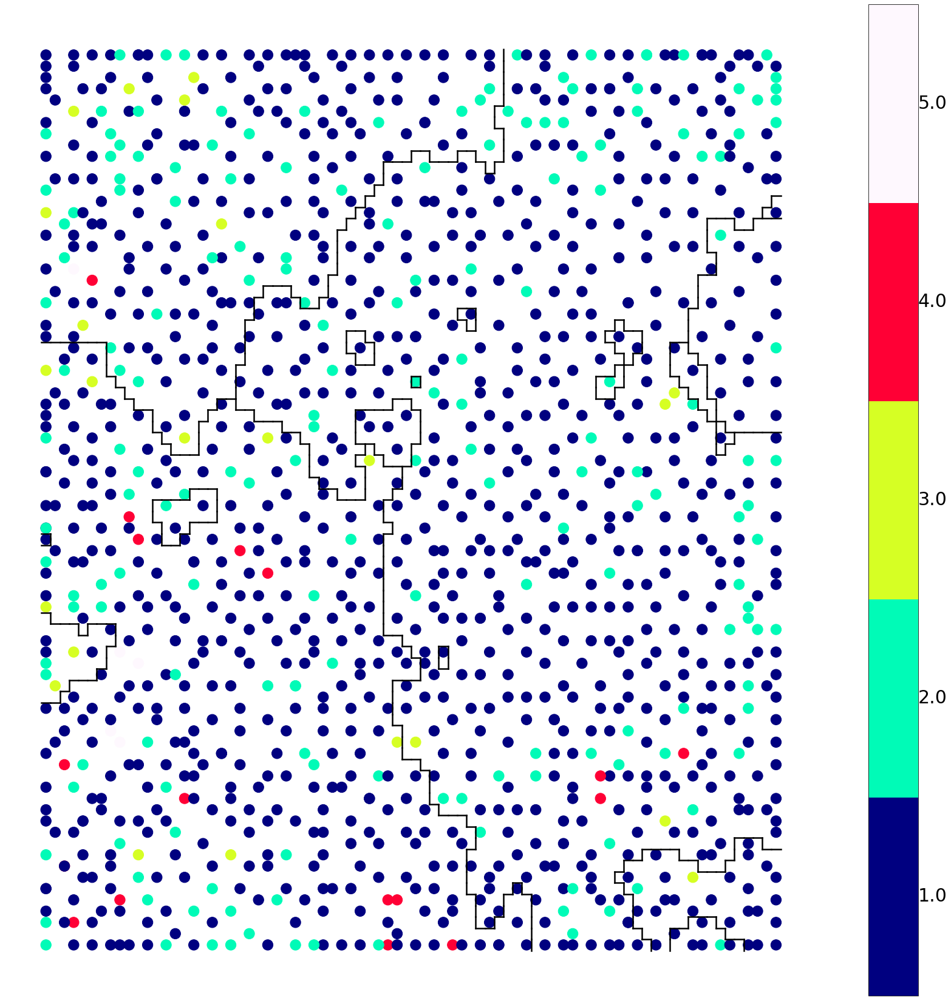

In [98]:
# data['naRing5by6'] = data['n5aRing']/data['n6aRing']

# 0 - 10
data['naRingbyChain_Categ'] = classify_by_group(data,"naRingbyChain",5)
clusteringmap_category(sm,4,data,"naRingbyChain_Categ",'./Images/descriptors/Mw_HOMO/naRingbyChain_Categ.png')

locator: <matplotlib.ticker.FixedLocator object at 0x0000012C2A293DA0>
Using fixed locator on colorbar
Setting pcolormesh


array([0, 0, 0, ..., 2, 2, 2])

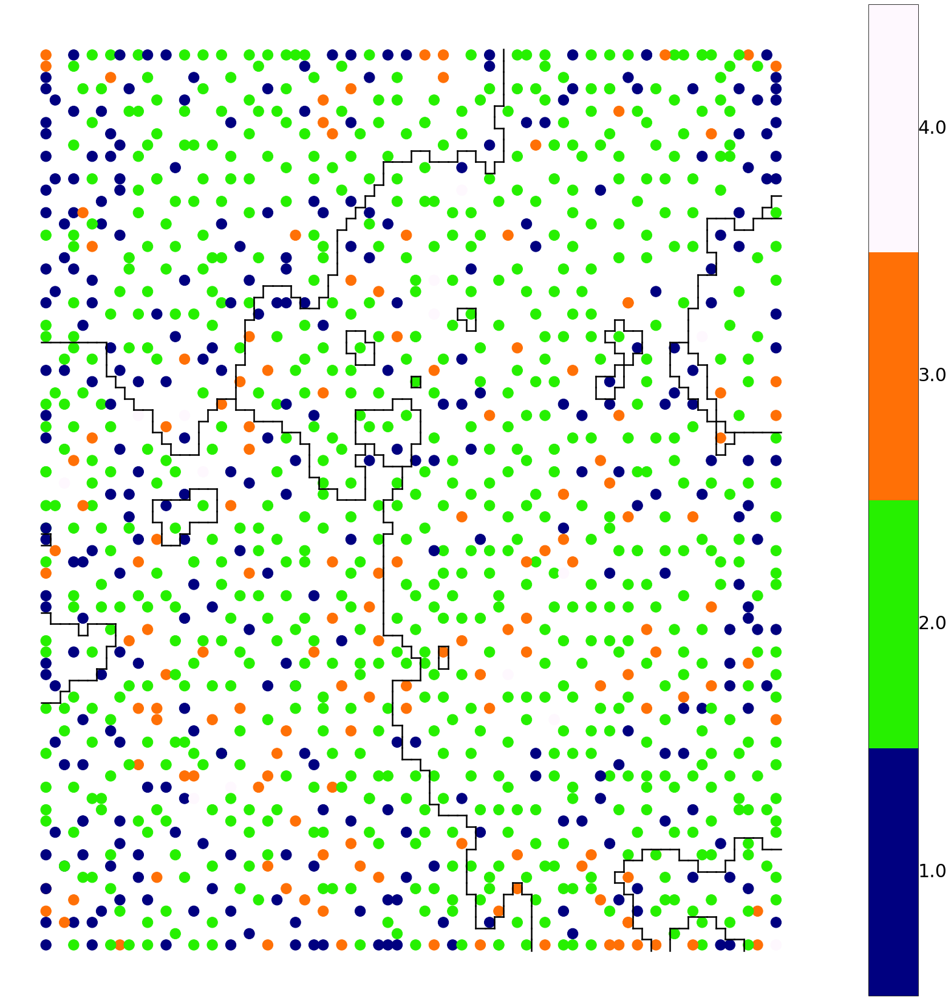

In [110]:
# 1 - 8
data['number_chains_Categ'] = classify_by_group(data,"number_chains",4)
clusteringmap_category(sm,4,data,"number_chains_Categ",'./Images/descriptors/Mw_HOMO/number_chains_Categ.png')

locator: <matplotlib.ticker.FixedLocator object at 0x0000012C6710AEF0>
Using fixed locator on colorbar
Setting pcolormesh


array([0, 0, 0, ..., 2, 2, 2])

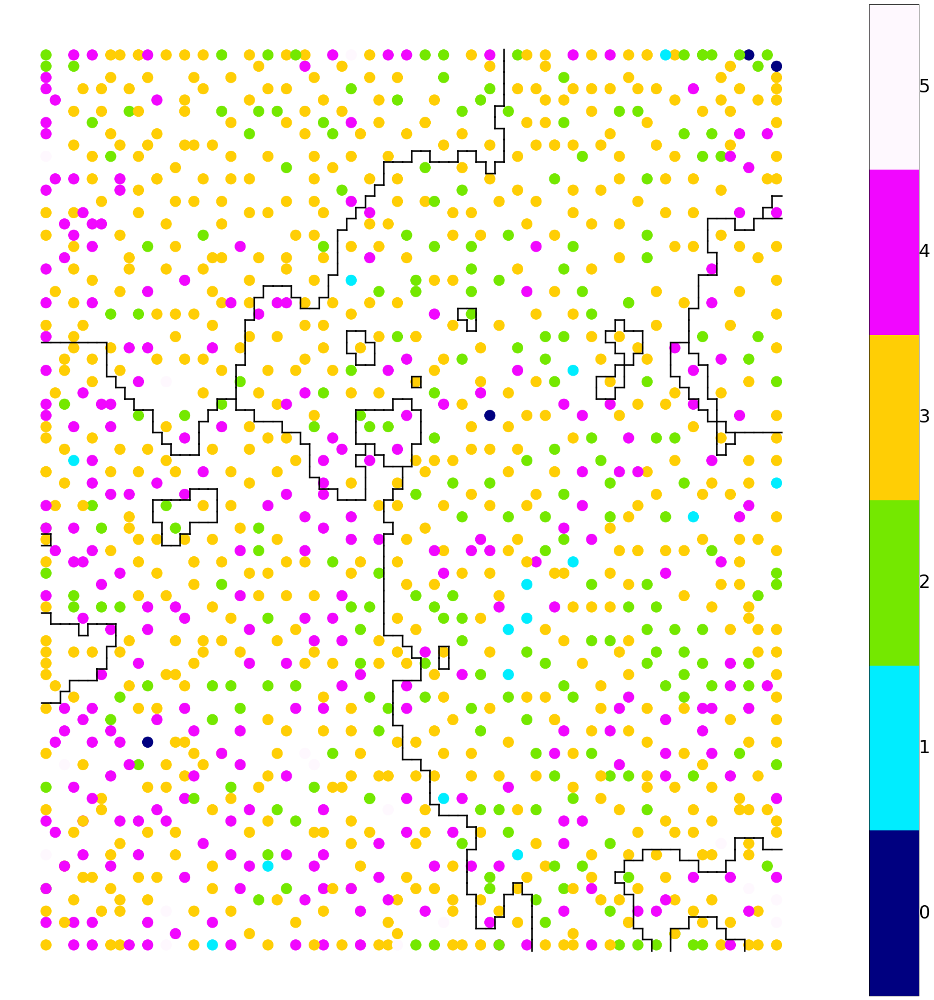

In [114]:
data['n5aRingCateg']
clusteringmap_category(sm,4,data,"n5aRingCateg",'./Images/descriptors/Mw_HOMO/n5aRingCateg.png')

### Other Moelcular Descriptors

possible ones used for analysis including the following:

1. Zagreb indice
2. walk count
3. atom number (S, N, O, F, Ge)
4. number of rings
5. SLogP 
6. Adjacency Matrix (SpAbs)

## Visualization of Cluster and Content

* Using Tim's code to see the content of each cluster


In [21]:
import importlib
import logging 
from tfprop_sompy import tfprop_vis
from tfprop_sompy import tfprop_config as tfpinit
from tfprop_sompy import cluster_inspector as ci

ModuleNotFoundError: No module named 'tfprop_config'

In [ ]:
importlib.reload(ci)

In [266]:
%matplotlib inline
# This makes all the loggers stay quiet unless it's important
logging.getLogger().setLevel(logging.WARNING)

cl_labels = ci.kmeans_clust(sm, 4)
clusters_list = ci.sort_materials_by_cluster(sm,df,cl_labels)

# # This makes it so it will display the full lists
pd.set_option('display.max_rows', 2000)
pd.set_option('display.width', 1000)
pd.set_option("display.max_columns",50)

# # This should be the last statement of the cell, to make it display
# # That, or assign the return value to a variable, and have that variable be the final expression in a cell
ci.cluster_tabs(sm, df, clusters_list, cl_labels)

NameError: name 'tfpinit' is not defined

In [ ]:
data #1203 by 1635 before dropping
cluster0 = data.filter(clusters_list[2],axis = "index")
cluster0 #36 by 

### Validating Results of Element Wise Production

In [13]:
# code book is the 
codebook = sm._normalizer.denormalize_by(sm.data_raw,sm.codebook.matrix)

#!!!!! in your case you should replace the 'id','name'... with the name of the columns in your dataset that are categorical data
#!!!!! replace dataset with the name of your dataset

codebookframe = pd.DataFrame(codebook, columns = df.columns)
codebookframe.head(3)

,Voc (V),Jsc (mA/cm2),FF,Mw (kg/mol),HOMO (eV)
0,0.426894,0.902303,0.337036,442.976007,6.069387
1,0.501218,2.630204,0.387543,230.829800,5.910065
2,0.564547,3.993312,0.418043,55.529874,5.749712


In [14]:
# codebookframe['Voc'] = codebookframe["HOMO"] * 0.9 - 4.2
codebookframe['PCE_Gen'] = codebookframe["Voc (V)"] * codebookframe["Jsc (mA/cm2)"] * codebookframe["FF"]

# is it possible to calculate molecular descriptor from

In [15]:
codebookframe.head(3)

,Voc (V),Jsc (mA/cm2),FF,Mw (kg/mol),HOMO (eV),PCE_Gen
0,0.426894,0.902303,0.337036,442.976007,6.069387,0.129822
1,0.501218,2.630204,0.387543,230.829800,5.910065,0.510900
2,0.564547,3.993312,0.418043,55.529874,5.749712,0.942441


In [16]:
codebook[:,-1] # the last column
codebook[:,0]

array([0.42689439, 0.5012178 , 0.56454681, ..., 0.77705417, 0.79100916,
       0.79824445])

locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x000001CE045B2DD8>
Using auto colorbar locator on colorbar
locator: <matplotlib.colorbar._ColorbarAutoLocator object at 0x000001CE045B2DD8>
Setting pcolormesh
findfont: Matching :family=sans-serif:style=normal:variant=normal:weight=normal:stretch=normal:size=30.0.
findfont: score(<Font 'DejaVu Sans Display' (DejaVuSansDisplay.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'STIXSizeThreeSym' (STIXSizThreeSymReg.ttf) normal normal regular normal>) = 10.05
findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-BoldOblique.ttf) oblique normal bold normal>) = 11.335
findfont: score(<Font 'cmsy10' (cmsy10.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'cmss10' (cmss10.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Oblique.ttf) oblique normal 400 normal>) = 1.05
findfont: score(<Font 'STIXNonUnicode' (STIXNonUniIta.ttf) italic normal 400 normal>) = 11.05
findf

findfont: score(<Font 'Dubai' (DUBAI-REGULAR.TTF) normal normal regular normal>) = 10.05
findfont: score(<Font 'ESSTIXFive' (ESSTIX5_.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Times New Roman' (times.ttf) normal normal roman normal>) = 10.145
findfont: score(<Font 'Cambria' (cambriai.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Malgun Gothic' (malgun.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Courant' (CON_____.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Courant' (COO_____.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'ESSTIXOne' (ESSTIX1_.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Cambria' (cambriab.ttf) normal normal bold normal>) = 10.335
findfont: score(<Font 'Gill Sans Ultra Bold Condensed' (GILLUBCD.TTF) normal normal bold condensed>) = 10.535
findfont: score(<Font 'Rockwell' (ROCKI.TTF) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Segoe UI' (segoeuii.ttf

findfont: score(<Font 'Century Schoolbook' (SCHLBKB.TTF) normal normal book normal>) = 10.05
findfont: score(<Font 'Gill Sans MT' (GILB____.TTF) normal normal bold normal>) = 10.335
findfont: score(<Font 'Niagara Engraved' (NIAGENG.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Candara' (Candara.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Symbol' (symbol.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Goudy Stout' (GOUDYSTO.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Segoe UI' (seguibli.ttf) italic normal black normal>) = 11.525
findfont: score(<Font 'HoloLens MDL2 Assets' (holomdl2.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Arial' (ariblk.ttf) normal normal black normal>) = 6.888636363636364
findfont: score(<Font 'Yu Gothic' (YuGothB.ttc) normal normal bold normal>) = 10.335
findfont: score(<Font 'Matura MT Script Capitals' (MATURASC.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'S

findfont: score(<Font 'Segoe UI' (segoeuil.ttf) normal normal light normal>) = 10.24
findfont: score(<Font 'Helonia' (HEB_____.ttf) normal normal bold normal>) = 10.335
findfont: score(<Font 'Eras Demi ITC' (ERASDEMI.TTF) normal normal demi normal>) = 10.24
findfont: score(<Font 'Wingdings' (wingding.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'MingLiU-ExtB' (mingliub.ttc) normal normal 400 normal>) = 10.05
findfont: score(<Font 'DejaVu Sans' (DejaVuSansCondensed-BoldOblique.ttf) oblique normal bold condensed>) = 1.535
findfont: score(<Font 'Constantia' (constan.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Modern No. 20' (MOD20.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Constantia' (constanb.ttf) normal normal bold normal>) = 10.335
findfont: score(<Font 'ESSTIXSeven' (ESSTIX7_.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Courier New' (courbi.ttf) italic normal bold normal>) = 11.335
findfont: score(<Font 'ESSTIX

findfont: score(<Font 'STKaiti' (STKAITI.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Candara' (Candarab.ttf) normal normal bold normal>) = 10.335
findfont: score(<Font 'Sitka Small' (SitkaI.ttc) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Bauhaus 93' (BAUHS93.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Malgun Gothic' (malgunbd.ttf) normal normal bold normal>) = 10.335
findfont: score(<Font 'Myanmar Text' (mmrtextb.ttf) normal normal bold normal>) = 10.335
findfont: score(<Font 'Calibri' (calibrii.ttf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Arial' (ARIALNI.TTF) italic normal 400 condensed>) = 7.613636363636363
findfont: score(<Font 'Bookman Old Style' (BOOKOS.TTF) normal normal book normal>) = 10.05
findfont: score(<Font 'Microsoft PhagsPa' (phagspab.ttf) normal normal bold normal>) = 10.335
findfont: score(<Font 'Playbill' (PLAYBILL.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'ESSTIXNine' (ESSTIX9_

findfont: score(<Font 'Corbel' (corbelb.ttf) normal normal bold normal>) = 10.335
findfont: score(<Font 'Franklin Gothic Demi Cond' (FRADMCN.TTF) normal normal demi condensed>) = 10.44
findfont: score(<Font 'Adobe Devanagari' (AdobeDevanagari-Italic.otf) italic normal 400 normal>) = 11.05
findfont: score(<Font 'Yu Gothic' (YuGothR.ttc) normal normal regular normal>) = 10.05
findfont: score(<Font 'Gloucester MT Extra Condensed' (GLECB.TTF) normal normal 400 condensed>) = 10.25
findfont: score(<Font 'Times New Roman' (timesbd.ttf) normal normal roman normal>) = 10.145
findfont: score(<Font 'MS Outlook' (OUTLOOK.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Elephant' (ELEPHNT.TTF) normal normal 400 normal>) = 10.05
findfont: score(<Font 'icon-large' (icon-large.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'Calibri' (calibri.ttf) normal normal 400 normal>) = 10.05
findfont: score(<Font 'icon-ui' (icon-ui.ttf) normal normal 400 normal>) = 10.05
findfont: Ma

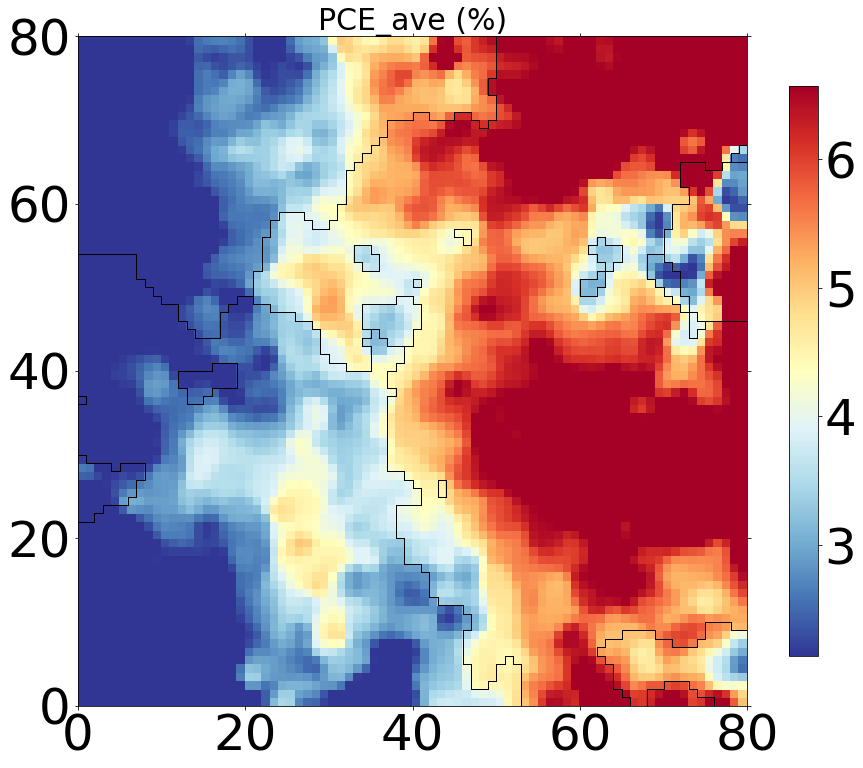

In [21]:
ind=-1   # ind will locate the column you just calculated, for example here, E*alpha is the last column 
codebook = codebookframe.values
plt.figure(figsize=(15, 15))
ax = plt.subplot(1, 1, 1)
mp = codebook[:, ind].reshape(sm.codebook.mapsize[0],sm.codebook.mapsize[1])
cmap = plt.get_cmap('RdYlBu_r')

min_color_scale = np.mean(codebook[:, ind].flatten()) - 1 \
                    * np.std(codebook[:, ind].flatten())
max_color_scale = np.mean(codebook[:, ind].flatten()) + 1 \
                    * np.std(codebook[:, ind].flatten())
min_color_scale = min_color_scale if min_color_scale >= \
                    np.min(codebook[:, ind].flatten()) \
                    else np.min(codebook[:, ind].flatten())
max_color_scale = max_color_scale if max_color_scale <= \
                    np.max(codebook[:, ind].flatten()) \
                    else np.max(codebook[:, ind].flatten())
norm = mpl.colors.Normalize(vmin=min_color_scale,
                            vmax=max_color_scale,
                            clip=True)

pl = ax.pcolormesh(mp.T, norm=norm, cmap=cmap)
ax.set_xlim([0, sm.codebook.mapsize[0]])
ax.set_ylim([0, sm.codebook.mapsize[1]])
ax.set_aspect('equal')
ax.set_title("PCE_ave (%)",fontsize=30)
ax.tick_params(labelbottom='off')  # turn off tick label
ax.tick_params(labelleft='off')  # turn off tick label
ax.tick_params(bottom='off', left='off',
            top='off', right='off')  # turn off ticks

msz = sm.codebook.mapsize

cl_labels = sklearn.cluster.KMeans(n_clusters=4,random_state=555).fit_predict(sm.codebook.matrix)

for i in range(len(cl_labels)):
    rect_x = [i // msz[1], i // msz[1],
            i // msz[1] + 1, i // msz[1] + 1]
    rect_y = [i % msz[1], i % msz[1] + 1,
            i % msz[1] + 1, i % msz[1]]

    if i % msz[1] + 1 < msz[1]:  # top border
        if cl_labels[i] != cl_labels[i+1]:
            ax.plot([rect_x[1], rect_x[2]],
                    [rect_y[1], rect_y[2]], 'k-', lw=1)

    if i + msz[1] < len(cl_labels):  # right border
        if cl_labels[i] != cl_labels[i+msz[1]]:
            ax.plot([rect_x[2], rect_x[3]],
                    [rect_y[2], rect_y[3]], 'k-', lw=1)


plt.colorbar(pl, shrink=0.7)
plt.show()

## Image Geneartion and Data Processing

In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn import model_selection
from rdkit import Chem
from rdkit.Chem import AllChem
from rdkit.Chem import AllProps
from rdkit.Chem.Draw import IPythonConsole
from rdkit.Chem.Draw import MolDrawing as MolDrawing
from rdkit.Chem.Draw.MolDrawing import DrawingOptions
from IPython.display import SVG
from rdkit.Chem.Draw import SimilarityMaps
from rdkit.Chem import rdDepictor
from rdkit.Chem.Draw import rdMolDraw2D
from rdkit.Chem import AllChem
from rdkit.Chem import AllProps
from rdkit.Chem import Draw
from rdkit.Chem import PandasTools
from rdkit.Chem import Descriptors
from rdkit.Chem import Descriptors3D
from rdkit.Chem import MACCSkeys
from rdkit.Chem import DataStructs
import rdkit.Chem.rdMolDescriptors
from rdkit.Chem.rdMolDescriptors import Properties
from rdkit.Chem import rdMolChemicalFeatures
from rdkit.Chem import MolToMolBlock
from rdkit.Chem import Mol
from rdkit.Chem import rdmolops
from rdkit.Chem import rdMolTransforms
from rdkit.Chem import rdFMCS
from rdkit.Chem.Fingerprints import FingerprintMols

from rdkit import Geometry
from rdkit.Geometry import Point3D
from rdkit.Geometry import Point2D
import time

%matplotlib inline

Loaded backend module://ipykernel.pylab.backend_inline version unknown.


In [14]:
name = data['Nickname']
name.count()

1203

In [15]:
def sort_by_name(target, data, names):
    """
    This program is used to extract rows with specific target string, such as PDI family,
    DPP family, NTz family, etc.
    """
    result = []
    ind = 0
    for string in names:
        if target in string:
            row = data.iloc[ind]
            result.append(row)
        ind += 1
    return pd.DataFrame(result)

In [16]:
def sort_by_value(target, categ, data):
    """
    
    """
    result = []
    ind = 0
    for value in categ:
        if target == value:
            result.append(data.iloc[ind])
        ind += 1
    return pd.DataFrame(result)

In [231]:
high_PCE_5 = sort_by_value(5, data['PCE_Categ'], data)
high_ind = list(high_PCE_5.Nickname)
high_ind

['PffBT4T-2OD',
 'PffBT4T-2OD',
 'PffBT4T-2OD',
 'PNTz4T-2OD',
 'PNTz4T',
 'PNOz4T',
 'PBDT-BT',
 'PBQ-4',
 'PBDT-TS1',
 'C3-DPPTTT',
 'PBDT-TS1',
 'PNTz4TF2',
 'PTzNTz-EHBO',
 'PTzNTz-EHHD',
 'PTzNTz-BOBO',
 'NT812',
 'rr-PTBS',
 'PThBDTP',
 'PITFBT',
 'PTZBIBDT',
 'PBDTBDD (PM6)',
 'POBDT(S)-T1',
 'PBDT-ST1',
 'PDBT-T1',
 'PBT1-MP',
 'PBT1-EH',
 'PBDF-T1',
 'PffBT-T3((1,2)-1',
 'PffBT-T3(1,2)-2',
 'TBTIT-h',
 'PBDTTT-EFT',
 'PBDTTT-EFS',
 'PBDD-ff4T',
 'PTB7-TV',
 'PffBX4T-2OD',
 'PBDTDTffBT-H',
 'PBDTDTffBT-R',
 'PBDTTT-H',
 'P3',
 'PMOT5',
 'PBDTBO-CIBTDD',
 'PBPD-Se',
 'PBDTT-O-TT-CF',
 'PBDTT-S-TT-CF',
 'PBDT-TSR',
 'P2',
 'PBTF-OP',
 'PCDPP',
 'P-TT',
 'PBDD4T-2F']

In [61]:
# extract different families (moieties) and export to csv
# sort_by_name('PDI',data, data['Nickname']).to_csv("./data/PDI.csv")
# sort_by_name('IDT',data, data['Nickname']).to_csv("./data/IDT.csv")
# sort_by_name('DPP',data, data['Nickname']).to_csv("./data/DPP.csv")
# sort_by_name('BDT',data, data['Nickname']).to_csv("./data/BDT.csv")
# sort_by_name('NTz',data, data['Nickname']).to_csv("./data/NTz.csv")

In [15]:
PDI = pd.read_csv("./data/PDI.csv")
IDT = pd.read_csv("./data/IDT.csv")
BDT = pd.read_csv("./data/BDT.csv")
NTz = pd.read_csv("./data/NTz.csv")
DPP = pd.read_csv("./data/DPP.csv")